# Diamonds Data set 

### Packages and functions : 

In [11]:
import pandas as pd
import numpy as np
import pycaret

import matplotlib.pyplot as plt
import seaborn as sns

import pandas_profiling 

from sklearn.preprocessing import  LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

from catboost import CatBoostRegressor
import xgboost as xgb

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.metrics import mean_squared_error, r2_score


from sklearn.model_selection import train_test_split as tts

import string
import warnings
warnings.filterwarnings('ignore')

pd.set_option("display.max_rows", None)

%matplotlib inline

In [12]:
def concat_df(train_data, test_data):
    # Returns a concatenated df of training and test set
    return pd.concat([train_data, test_data], sort=True).reset_index(drop=True)

## Data Overview

In [29]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')
df_all = concat_df(df_train, df_test)

In [30]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35940 entries, 0 to 35939
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    35940 non-null  float64
 1   cut      35940 non-null  object 
 2   color    35940 non-null  object 
 3   clarity  35940 non-null  object 
 4   depth    35940 non-null  float64
 5   table    35940 non-null  float64
 6   price    35940 non-null  float64
 7   x        35940 non-null  float64
 8   y        35940 non-null  float64
 9   z        35940 non-null  float64
 10  id       35940 non-null  int64  
dtypes: float64(7), int64(1), object(3)
memory usage: 3.0+ MB


In [31]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    12000 non-null  float64
 1   cut      12000 non-null  object 
 2   color    12000 non-null  object 
 3   clarity  12000 non-null  object 
 4   depth    12000 non-null  float64
 5   table    12000 non-null  float64
 6   x        12000 non-null  float64
 7   y        12000 non-null  float64
 8   z        12000 non-null  float64
 9   id       12000 non-null  int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 937.6+ KB


In [32]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47940 entries, 0 to 47939
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    47940 non-null  float64
 1   clarity  47940 non-null  object 
 2   color    47940 non-null  object 
 3   cut      47940 non-null  object 
 4   depth    47940 non-null  float64
 5   id       47940 non-null  int64  
 6   price    35940 non-null  float64
 7   table    47940 non-null  float64
 8   x        47940 non-null  float64
 9   y        47940 non-null  float64
 10  z        47940 non-null  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 4.0+ MB


In [33]:
df_all.tail()

,carat,clarity,color,cut,depth,id,price,table,x,y,z
47935,1.20,VS2,G,Very Good,62.2,11995,NaN,57.0,6.75,6.78,4.21
47936,0.43,SI1,D,Ideal,61.5,11996,NaN,56.0,4.87,4.82,2.98
47937,1.50,VS1,F,Premium,62.6,11997,NaN,58.0,7.31,7.26,4.56
47938,1.00,VS2,H,Very Geod,60.7,11998,NaN,60.0,6.55,6.49,3.96
47939,1.06,VS2,D,Very Good,62.8,11999,NaN,55.0,6.53,6.56,4.11


In [34]:
df_train.profile_report()

## Data cleaning

In [35]:
# Replace in test and training datasets the cut "Very Geod" for "Very Good"
df_test['cut'] = df_test['cut'].str.replace('Very Geod','Very Good')
df_train['cut'] = df_train['cut'].str.replace('Very Geod','Very Good')

In [36]:
# see 0s in x,y,z

df_train.loc[(df_train['x']==0) | (df_train['y']==0) | (df_train['z']==0)]

,carat,cut,color,clarity,depth,table,price,x,y,z,id
2203,22.47695,Good,G,I1,64.0,61.0,4731.0,7.15,7.04,0.0,2203
9351,2.25000,Premium,H,SI2,62.8,59.0,18034.0,0.00,0.00,0.0,9351
9816,1.12000,Premium,G,I1,60.4,59.0,2383.0,6.71,6.67,0.0,9816
10893,1.15000,Ideal,G,VS2,59.2,56.0,5564.0,6.88,6.83,0.0,10893
12597,2.25000,Premium,I,SI1,61.3,58.0,15397.0,8.52,8.42,0.0,12597
17931,1.10000,Premium,G,SI2,63.0,59.0,3696.0,6.50,6.47,0.0,17931
21261,2.18000,Premium,H,SI2,59.4,61.0,12631.0,8.49,8.45,0.0,21261
22062,1.01000,Premium,H,I1,58.1,59.0,3167.0,6.66,6.60,0.0,22062
25191,0.71000,Good,F,SI2,64.1,60.0,2130.0,0.00,0.00,0.0,25191
26607,2.80000,Good,G,SI2,63.8,58.0,18788.0,8.90,8.85,0.0,26607


In [37]:
df_test.loc[(df_test['x']==0) | (df_test['y']==0) | (df_test['z']==0)]

,carat,cut,color,clarity,depth,table,x,y,z,id
163,1.00,Premium,G,SI2,59.1,59.0,6.55,6.48,0.0,163
1980,1.01,Premium,F,SI2,59.2,58.0,6.50,6.47,0.0,1980
4027,2.20,Premium,H,SI1,61.2,59.0,8.42,8.37,0.0,4027
4243,0.71,Good,F,SI2,64.1,60.0,0.00,0.00,0.0,4243
7005,1.20,Premium,D,VVS1,62.1,59.0,0.00,0.00,0.0,7005
11390,2.02,Premium,H,VS2,62.7,53.0,8.02,7.95,0.0,11390
11442,1.00,Very Good,H,VS2,63.3,53.0,0.00,0.00,0.0,11442


As there are only 7 and we need to estimate them we will get z based on the value of x as they are very correlated

Text(0, 0.5, 'x')

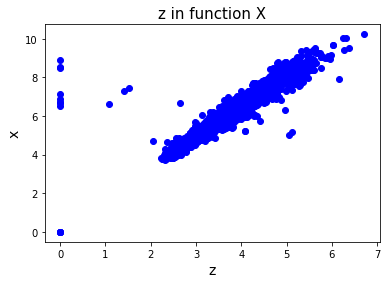

In [38]:
plt.scatter(x = "z", y = "x", data = df_train, color = "blue")
plt.title("z in function X", fontsize = 15)
plt.xlabel("z", fontsize = 14)
plt.ylabel("x", fontsize = 14)

For those that we do not have x we will estimate x in function of carat and then y and z (y is apporx = x)

(3.0, 10.0)

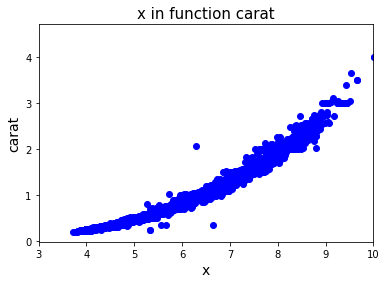

In [39]:
plt.scatter(x = "x", y = "carat", data = df_train.query("carat<10"), color = "blue")
plt.title("x in function carat", fontsize = 15)
plt.xlabel("x", fontsize = 14)
plt.ylabel("carat", fontsize = 14)
plt.xlim([3, 10])

In [40]:
#drop rows with 0s in x,y,z for the train dataframe
df_train = df_train[(df_train[['x','y','z']] != 0).all(axis=1)]


#Manual input of x,y,z for the test file as we cant delete them



df_test.at[4243,'x']=df_all.loc[df_all.carat==0.71].x.median()
df_test.at[4243,'y']=df_all.loc[df_all.x==(df_all.loc[df_all.carat==0.71].x.median())].y.median()
df_test.at[4243,'z']=df_all.loc[df_all.x==(df_all.loc[df_all.carat==0.71].x.median())].z.median()

df_test.at[7005,'x']=df_all.loc[df_all.carat==1.20].x.median()
df_test.at[7005,'y']=df_all.loc[df_all.x==(df_all.loc[df_all.carat==1.20].x.median())].y.median()
df_test.at[7005,'z']=df_all.loc[df_all.x==(df_all.loc[df_all.carat==1.20].x.median())].z.median()

      
df_test.at[11442,'x']=df_all.loc[df_all.carat==1].x.median()
df_test.at[11442,'y']=df_all.loc[df_all.x==(df_all.loc[df_all.carat==1].x.median())].y.median()
df_test.at[11442,'z']=df_all.loc[df_all.x==(df_all.loc[df_all.carat==1].x.median())].z.median()


df_test.at[163,'z']= df_all.loc[df_all.x==6.55].z.median()           
df_test.at[1980,'z']= df_all.loc[df_all.x==6.50].z.median()
df_test.at[4027,'z']= df_all.loc[df_all.x==8.42].z.median()
df_test.at[11390,'z']=df_all.loc[df_all.x==8.02].z.median()


## Feature Engineering and outliers analysis

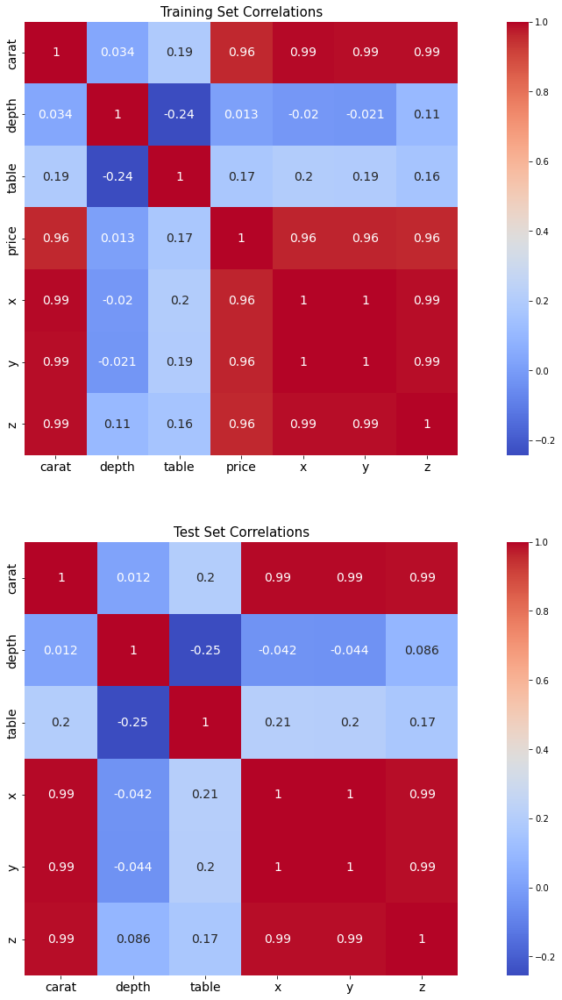

In [41]:
fig, axs = plt.subplots(nrows=2, figsize=(20, 20))

sns.heatmap(df_train.drop(['id'], axis=1).corr(method='spearman'), ax=axs[0], annot=True, square=True, cmap='coolwarm', annot_kws={'size': 14})
sns.heatmap(df_test.drop(['id'], axis=1).corr(method='spearman'), ax=axs[1], annot=True, square=True, cmap='coolwarm', annot_kws={'size': 14})

for i in range(2):    
    axs[i].tick_params(axis='x', labelsize=14)
    axs[i].tick_params(axis='y', labelsize=14)
    
axs[0].set_title('Training Set Correlations', size=15)
axs[1].set_title('Test Set Correlations', size=15)

plt.show()

In [42]:
#We see that the x,y,zs of the diamond are very correlated,lets make a new variable called volume

df_train['volume'] = df_train['x']*df_train['y']*df_train['z']/2.88
df_test['volume'] = df_test['x']*df_test['y']*df_test['z']/2.88
# we adjust dividing also by 2.88 as the volume we have is not the diamond volume, but the cube that contains the diamond -- the 2.88 figure has been calculating in order to obtain approx avg. density below  3.53 (maximum density of a diamond) in the Q3


# make a new variable called custom just 
#df_train['custom'] = df_train['table']/df_train['depth']
#df_test['custom'] = df_test['table']/df_test['depth']
#
#df_train['carat_log'] = np.log(df_train['carat'])
#df_test['carat_log'] = np.log(df_test['carat'])
#
#df_train['volume_log'] = np.log(df_train['volume'])
#df_test['volume_log'] = np.log(df_test['volume'])
#
#df_train['table_log'] = np.log(df_train['volume'])
#df_test['table_log'] = np.log(df_test['volume'])
#
#df_train['depth_log'] = np.log(df_train['volume'])
#df_test['depth_log'] = np.log(df_test['volume'])
#
#
#df_train['price_log'] = np.log(df_train['price'])

#the density of a diamond is between 3.5 and 3.53 gr, per cm3

#one carat is 200 mg

#we have volume in mm3 so density = carat*0.2 / volume*0.001

#lets make a new column called density in our data set 


df_train['density'] = (df_train['carat']*0.2) / (df_train['volume'] * 0.001)
df_test['density'] = (df_test['carat']*0.2) / (df_test['volume'] * 0.001)

def is_a_diamond(x):
    if x>6:
        return 0
    else:
        return 1


df_train["is_a_diamond"]=df_train.density.apply(is_a_diamond)
df_test["is_a_diamond"]=df_test.density.apply(is_a_diamond)

#df_train = df_train.drop(columns=['x', 'y','z'])
#df_test = df_test.drop(columns=['x', 'y','z'])

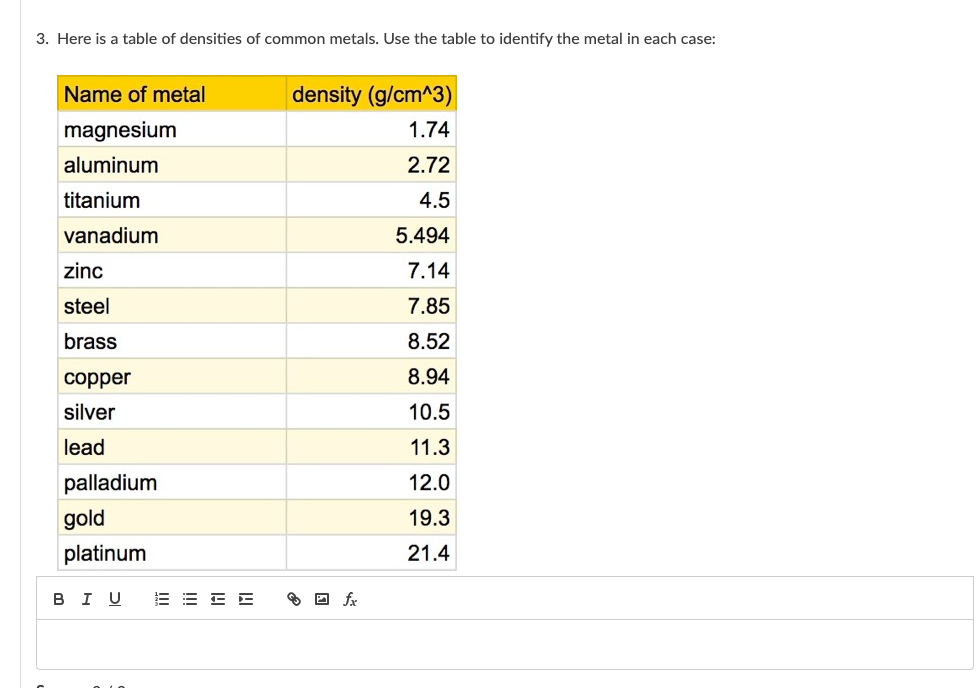

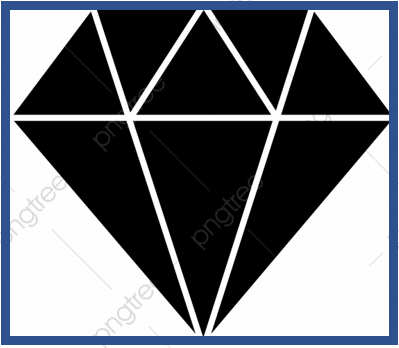

In [43]:
df_train.query("is_a_diamond==0").head()

,carat,cut,color,clarity,depth,table,price,x,y,z,id,volume,density,is_a_diamond
86,43.372332,Ideal,F,VVS1,61.1,56.0,1174.0,4.50,4.53,2.76,86,19.535625,444.033216,0
335,46.688176,Very Good,D,SI2,61.6,57.0,5226.0,6.61,6.67,4.09,335,62.612077,149.134730,0
819,43.985768,Very Good,E,VVS1,61.0,58.0,485.0,3.99,4.01,2.44,819,13.555471,648.974405,0
1649,46.701922,Ideal,I,IF,62.2,57.0,864.0,4.37,4.35,2.71,1649,17.887411,522.176414,0
1686,49.990359,Good,E,SI1,63.6,62.0,2407.0,5.60,5.57,3.55,1686,38.448472,260.038207,0


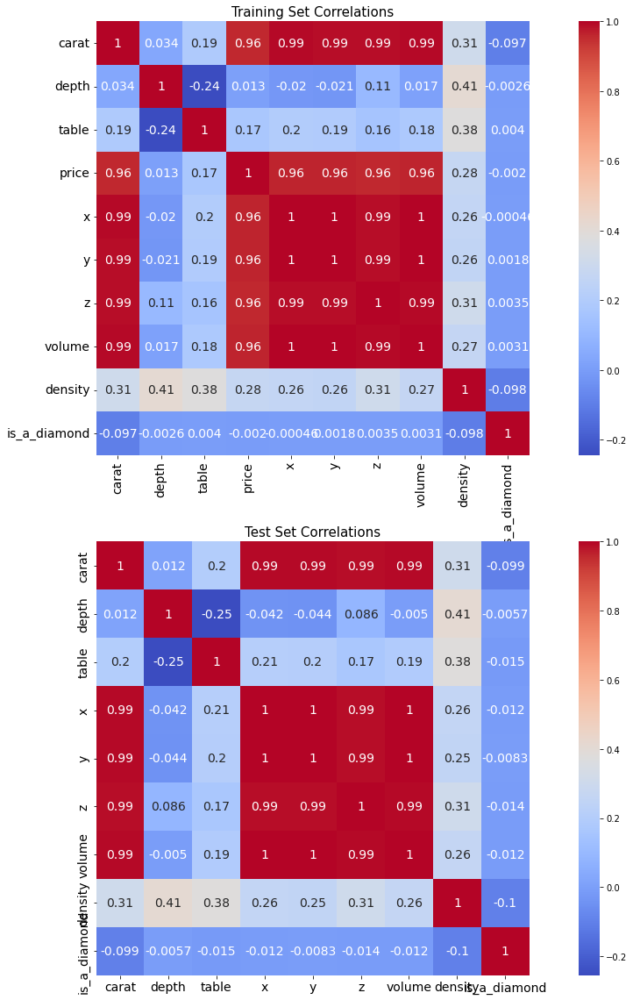

In [44]:
fig, axs = plt.subplots(nrows=2, figsize=(20, 20))

sns.heatmap(df_train.drop(['id'], axis=1).corr(method='spearman'), ax=axs[0], annot=True, square=True, cmap='coolwarm', annot_kws={'size': 14})
sns.heatmap(df_test.drop(['id'], axis=1).corr(method='spearman'), ax=axs[1], annot=True, square=True, cmap='coolwarm', annot_kws={'size': 14})

for i in range(2):    
    axs[i].tick_params(axis='x', labelsize=14)
    axs[i].tick_params(axis='y', labelsize=14)
    
axs[0].set_title('Training Set Correlations', size=15)
axs[1].set_title('Test Set Correlations', size=15)

plt.show()

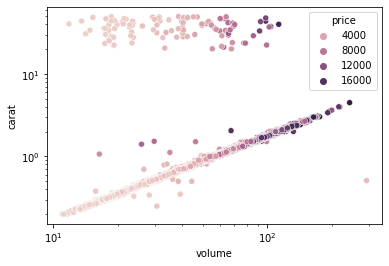

In [45]:
#lets check the correlation of carat and volume and price
sns.scatterplot(x='volume', y='carat', hue='price', data=df_train)
plt.xscale("log")
plt.yscale("log")

# 1. The correlation between carat and volume is almost linear, except for some outliers
# 2. as seen below, the outliers in price/carat, ar not outliers if we see them by volume


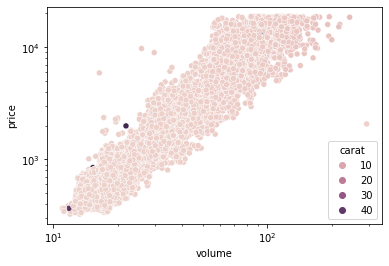

In [46]:
sns.scatterplot(x='volume', y='price', hue='carat', data=df_train)
plt.xscale("log")
plt.yscale("log")

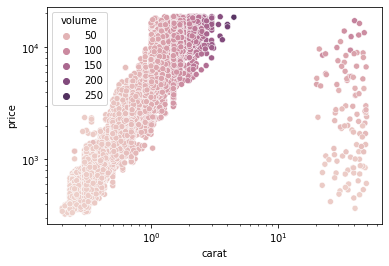

In [47]:
sns.scatterplot(x='carat', y='price', hue='volume', data=df_train)
plt.xscale("log")
plt.yscale("log")

# it seems that in carat is extrange that there are not diamonds between 6 and 10 carats aprox... 

## Outliers carat/volume/price

Though there are outliers in the carat category, we will see later that excluding them gave us lower MSE score in Gradient boosting tree algortihm

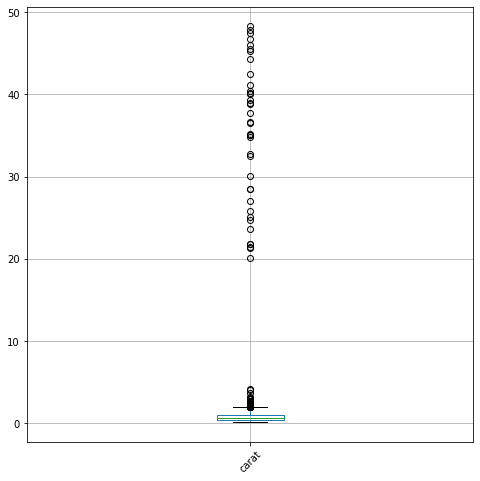

In [48]:
plt.figure(figsize=(8,8))

df_test.boxplot(column=['carat'])

plt.xticks(rotation=45);

In [49]:
df_test['density'].describe()

count    12000.000000
mean         4.131164
std         12.835854
min          0.350339
25%          3.484302
50%          3.522987
75%          3.565021
max        495.313601
Name: density, dtype: float64

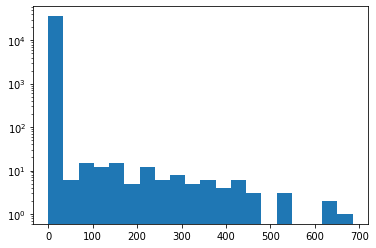

In [50]:
plt.hist(data=df_train, x='density', bins=20)
plt.yscale("log")

In [51]:
#Below we see that there is imposible to have diamonds with density above 4, but we have densities up to 600

In [52]:
df_train.query('density>100').shape

(89, 14)

In [53]:
df_train.query('density>500').shape

(6, 14)

In [54]:
df_train.query('density>500')

,carat,cut,color,clarity,depth,table,price,x,y,z,id,volume,density,is_a_diamond
819,43.985768,Very Good,E,VVS1,61.0,58.0,485.0,3.99,4.01,2.44,819,13.555471,648.974405,0
1649,46.701922,Ideal,I,IF,62.2,57.0,864.0,4.37,4.35,2.71,1649,17.887411,522.176414,0
8882,48.668790,Ideal,E,VVS1,61.7,57.0,846.0,4.16,4.14,2.56,8882,15.308800,635.827625,0
22612,46.740827,Premium,E,VS2,60.6,59.0,872.0,4.39,4.36,2.65,22612,17.611826,530.789101,0
28891,40.523963,Ideal,E,VS2,59.7,55.0,367.0,3.86,3.84,2.30,28891,11.837333,684.680602,0
34619,49.727923,Ideal,D,SI2,59.5,57.0,612.0,4.50,4.47,2.67,34619,18.648281,533.324466,0


In [55]:
#If we check first diamond it doesn´t make sense at all that a diamond with weight 44 carats = 44*200 mg = 8.8 kg. 
#to have x,y,z of 3.99, 4.01 and 2.44 mm respectively

In [56]:
df_train.query('density>5').shape, df_train.query('density<2').shape

((116, 14), (5, 14))

In [57]:
df_test.query('density>5').shape, df_test.query('density<2').shape

((42, 13), (2, 13))

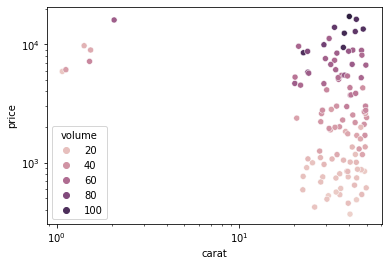

In [58]:
sns.scatterplot(x='carat', y='price', hue='volume', data=df_train.query('density>6'))
plt.xscale("log")
plt.yscale("log")

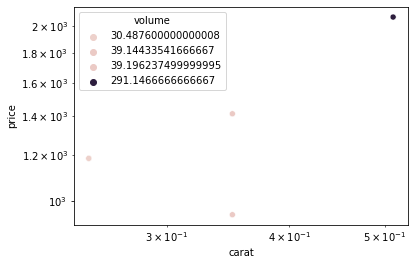

In [59]:
sns.scatterplot(x='carat', y='price', hue='volume', data=df_train.query('density<2'))
plt.xscale("log")
plt.yscale("log")

In [60]:
# We see that in the train sample we have also non diamonds

## Categorical Variables cut, color and clarity

We will try several approaches with these variables

In [61]:
df_train['price_carat']=df_train.price/df_train.carat

In [62]:
df_train.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,id,volume,density,is_a_diamond,price_carat
0,1.01,Very Good,F,SI2,62.2,58.0,4332.0,6.33,6.38,3.95,0,55.389698,3.646888,1,4289.108911
1,0.90,Very Good,I,VS2,61.4,58.0,4089.0,6.22,6.25,3.83,1,51.698351,3.481736,1,4543.333333
2,0.53,Ideal,E,VVS2,62.2,54.0,2273.0,5.19,5.23,3.24,2,30.536663,3.471237,1,4288.679245
3,0.32,Ideal,I,IF,60.8,54.0,673.0,4.44,4.47,2.71,3,18.675288,3.426989,1,2103.125000
4,1.06,Ideal,G,VVS2,61.0,57.0,7900.0,6.55,6.57,4.00,4,59.768750,3.547004,1,7452.830189


First lets see cut

<AxesSubplot:xlabel='volume', ylabel='price_carat'>

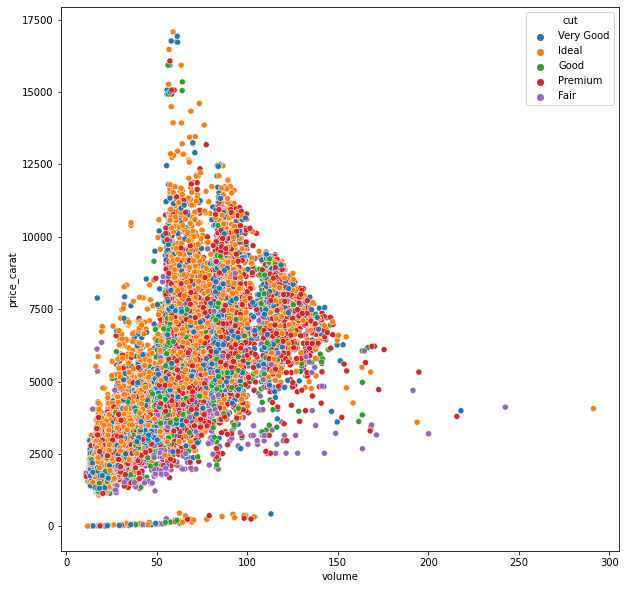

In [63]:
from matplotlib.pyplot import figure
figure(figsize=(10, 10))

sns.scatterplot(x='volume', y='price_carat', hue='cut', data=df_train)



<AxesSubplot:xlabel='volume', ylabel='price_carat'>

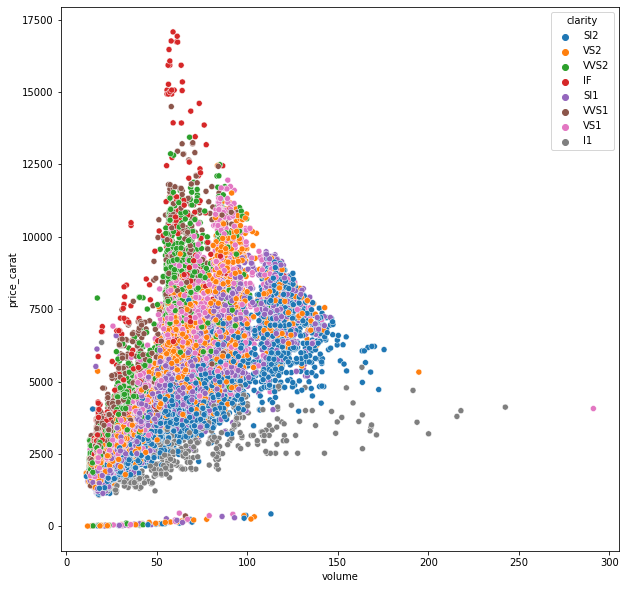

In [64]:
figure(figsize=(10, 10))

sns.scatterplot(x='volume', y='price_carat', hue='clarity', data=df_train)


<AxesSubplot:xlabel='volume', ylabel='price_carat'>

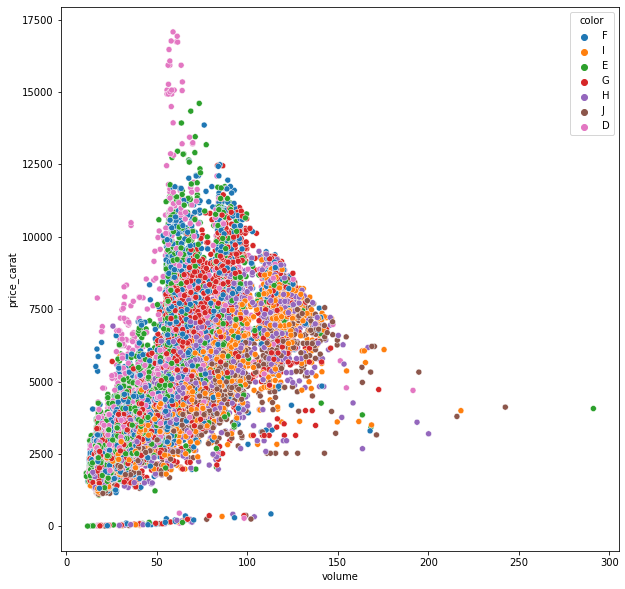

In [65]:
figure(figsize=(10, 10))

sns.scatterplot(x='volume', y='price_carat', hue='color', data=df_train)



## CUT,COLOR AND CLARITY WITH CUSTOM VALUES BASED ON INFO ON PRICES ON THE WEB

In [66]:
#separamos antes de aplicar labels por si queremos cambiar
df_train_2=df_train.copy()
df_test_2=df_test.copy()

In [67]:
df_train_2.color.value_counts()

G    7648
E    6513
F    6307
H    5478
D    4448
I    3645
J    1888
Name: color, dtype: int64

In [68]:
df_train_2.clarity.value_counts()

SI1     8627
VS2     8242
SI2     6085
VS1     5491
VVS2    3326
VVS1    2457
IF      1217
I1       482
Name: clarity, dtype: int64

In [69]:
df_train_2.cut.value_counts()

Ideal        14349
Premium       9210
Very Good     8054
Good          3235
Fair          1079
Name: cut, dtype: int64

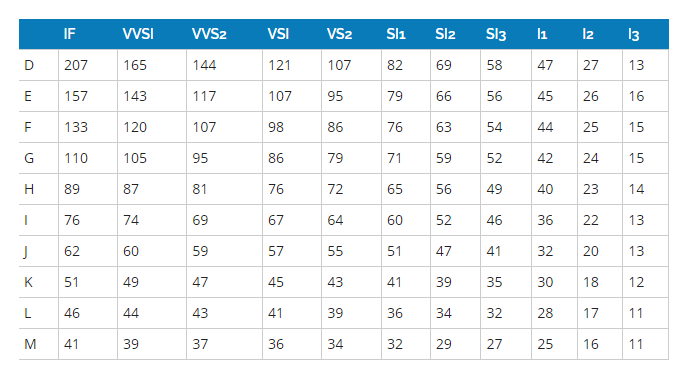

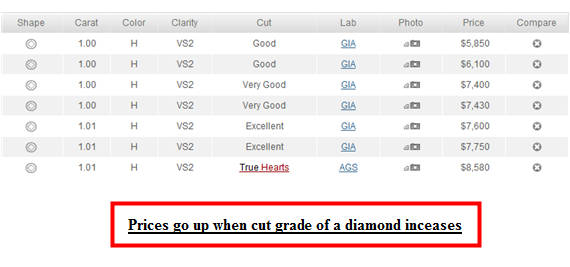

In [70]:
# COLOR
D= (107)/(107)
E= (95)/(107)
F= (86)/(107)
G= (79)/(107)
H= (72)/(107)
I= (64)/(107)
J= (55)/(107)

#CLARITY
IF  = (110)/(110)
VVS1= (105)/(110)
VVS2= (95)/(110)
VS1 = (86)/(110)
VS2 = (79)/(110)
SI1 = (71)/(110)
SI2 = (59)/(110)
I1  = (42)/(110)

#CUT
Ideal     = (8580)/(8580)
Premium   = (7750)/(8580)
Very_Good = (7430)/(8580)
Good      = (6100)/(8580)
Fair      = (5300)/(8580)


In [71]:
# color price of the most common diamond / max-min
df_train_2.color   = df_train_2.color.replace(["D", "E", "F", "G", "H", "I", "J"], [D, E, F, G, H, I, J])

df_train_2.clarity = df_train_2.clarity.replace(["IF", "VVS1", "VVS2", "VS1", "VS2","SI1", "SI2", "I1"], [IF, VVS1, VVS2, VS1, VS2,SI1, SI2, I1])

df_train_2.cut = df_train_2.cut.replace(["Ideal", "Premium", "Very Good", "Good", "Fair" ], [Ideal, Premium, Very_Good, Good, Fair])         

df_test_2.color   = df_test_2.color.replace(["D", "E", "F", "G", "H", "I", "J"], [D, E, F, G, H, I, J])

df_test_2.clarity = df_test_2.clarity.replace(["IF", "VVS1", "VVS2", "VS1", "VS2","SI1", "SI2", "I1"], [IF, VVS1, VVS2, VS1, VS2,SI1, SI2, I1])

df_test_2.cut = df_test_2.cut.replace(["Ideal", "Premium", "Very Good", "Good", "Fair" ], [Ideal, Premium, Very_Good, Good, Fair])  

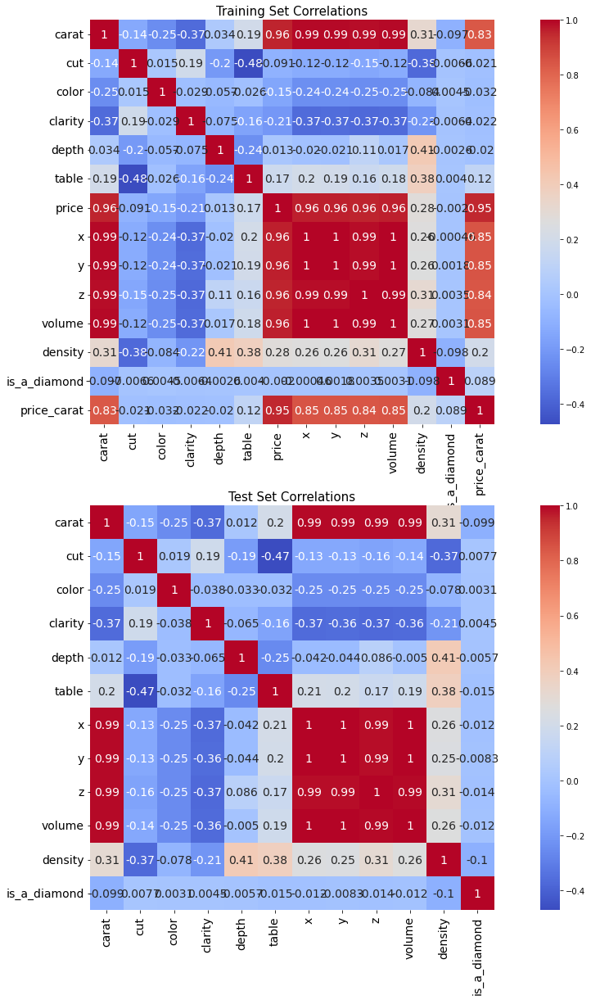

In [72]:
fig, axs = plt.subplots(nrows=2, figsize=(20, 20))

sns.heatmap(df_train_2.drop(['id'], axis=1).corr(method='spearman'), ax=axs[0], annot=True, square=True, cmap='coolwarm', annot_kws={'size': 14})
sns.heatmap(df_test_2.drop(['id'], axis=1).corr(method='spearman'), ax=axs[1], annot=True, square=True, cmap='coolwarm', annot_kws={'size': 14})

for i in range(2):    
    axs[i].tick_params(axis='x', labelsize=14)
    axs[i].tick_params(axis='y', labelsize=14)
    
axs[0].set_title('Training Set Correlations', size=15)
axs[1].set_title('Test Set Correlations', size=15)

plt.show()

In [73]:
df_train_2.to_csv('df_train_2.csv')
df_test_2.to_csv('df_test_2.csv')


In [8]:
df_train_2=pd.read_csv('df_train_2.csv')
df_test_2=pd.read_csv('df_test_2.csv')

In [74]:
df_train_2.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,id,volume,density,is_a_diamond,price_carat
0,1.01,0.865967,0.803738,0.536364,62.2,58.0,4332.0,6.33,6.38,3.95,0,55.389698,3.646888,1,4289.108911
1,0.90,0.865967,0.598131,0.718182,61.4,58.0,4089.0,6.22,6.25,3.83,1,51.698351,3.481736,1,4543.333333
2,0.53,1.000000,0.887850,0.863636,62.2,54.0,2273.0,5.19,5.23,3.24,2,30.536663,3.471237,1,4288.679245
3,0.32,1.000000,0.598131,1.000000,60.8,54.0,673.0,4.44,4.47,2.71,3,18.675288,3.426989,1,2103.125000
4,1.06,1.000000,0.738318,0.863636,61.0,57.0,7900.0,6.55,6.57,4.00,4,59.768750,3.547004,1,7452.830189


In [75]:
df_test_2.head()

,carat,cut,color,clarity,depth,table,x,y,z,id,volume,density,is_a_diamond
0,0.70,0.710956,0.514019,0.863636,64.3,56.0,5.57,5.63,3.60,0,39.198875,3.571531,1
1,0.31,0.903263,0.887850,0.863636,61.9,58.0,4.38,4.35,2.70,1,17.862187,3.471019,1
2,0.84,0.903263,0.803738,0.645455,59.0,59.0,6.18,6.13,3.63,2,47.748869,3.518408,1
3,1.03,0.617716,0.887850,0.645455,65.1,58.0,6.35,6.24,4.10,3,56.409167,3.651889,1
4,1.20,0.903263,0.514019,0.645455,60.5,59.0,6.84,6.79,4.12,4,66.440150,3.612274,1


## With optimal

In [ ]:
df_train_2.head()

In [ ]:
#df_train_2 = df_train_2.drop(df_train_2[(df_train_2['price_carat'] < 800) & (df_train_2['volume'] > 175)].index)
# Formula was just to try to exclude outliers but worsened the results

In [19]:
chosen_variables= [
                'volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                #,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                #,'is_a_diamond'
    #,"x","y","z"
               ]

#separate X and Y

X = df_train_2[chosen_variables]      # extra features

y = df_train_2['price']

X_train, X_test, y_train, y_test = tts(X,y,test_size=0.2, train_size=0.8, random_state=42)

X_graded = df_test_2[chosen_variables]

y_graded = pd.read_csv('y_test.csv')
y_graded = y_graded[["price"]]



NameError: name 'df_test_2' is not defined

In [ ]:
X.shape, y.shape, X_graded.shape, y_graded.shape

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

In [ ]:
sc = StandardScaler()

transfrom_variables = ['volume'
         ,'depth' 
         ,'table'
         ,'carat'
         #,'density'
        #,"x","y","z"
        ]

X[transfrom_variables] = sc.fit_transform(X[transfrom_variables])
X_train[transfrom_variables] = sc.fit_transform(X_train[transfrom_variables])
X_test[transfrom_variables] = sc.transform(X_test[transfrom_variables])

X_graded[transfrom_variables] = sc.transform(X_graded[transfrom_variables])


#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

In [ ]:
## Primero quitando variables density e is a diamond

In [ ]:
from catboost import CatBoost, Pool
from catboost import CatBoostRegressor
#cat_variables=['is_a_diamond']
#para density y isadiamond  rf = CatBoostRegressor(depth=8, learning_rate=0.02, l2_leaf_reg=4, iterations=3200, loss_function='RMSE', logging_level='Silent', thread_count=10)
rf = CatBoostRegressor(verbose=0, depth=7, learning_rate=0.02, l2_leaf_reg=3, iterations=2000, loss_function='RMSE', thread_count=10)

rf.fit(X_train, y_train,
             #cat_variables
      )
y_pred = rf.predict(X_test)


print('')
print('Score : %.4f' % rf.score(X_test, y_test))


rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')

print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)


train_score=rf.score(X_train, y_train)  
test_score=rf.score(X_test, y_test)


train_score, test_score

cross_val_score(rf, X_test, y_test, cv=3)

rf = CatBoostRegressor(verbose=0, depth=7, learning_rate=0.02, l2_leaf_reg=3, iterations=2000, loss_function='RMSE', thread_count=10)

rf.fit(X, y
       #cat_variables
      )
y_graded_pred = rf.predict(X_graded)
rmse_verdadero = mean_squared_error(y_graded, y_graded_pred)**0.5

print('RMSE VERDADERO   : %0.2f ' % rmse_verdadero)



In [ ]:
## Con density e is a diamond

In [ ]:
cat_variables=['is_a_diamond']
rf = CatBoostRegressor(depth=8, learning_rate=0.02, l2_leaf_reg=4, iterations=3200, loss_function='RMSE', logging_level='Silent', thread_count=10)
#rf = CatBoostRegressor(depth=7, learning_rate=0.02, l2_leaf_reg=3, iterations=2000, loss_function='RMSE', logging_level='Silent', thread_count=10)

rf.fit(X_train, y_train, 
       cat_variables
      )
y_pred = rf.predict(X_test)

print('')
print('Score : %.4f' % rf.score(X_test, y_test))


rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')

print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)


train_score=rf.score(X_train, y_train)  
test_score=rf.score(X_test, y_test)


train_score, test_score

cross_val_score(rf, X_test, y_test, cv=3)

rf = CatBoostRegressor(depth=8, learning_rate=0.02, l2_leaf_reg=4, iterations=3200, loss_function='RMSE', logging_level='Silent', thread_count=10)
rf.fit(X, y
       #cat_variables
      )
y_graded_pred = rf.predict(X_graded)
rmse_verdadero = mean_squared_error(y_graded, y_graded_pred)**0.5

print('RMSE VERDADERO   : %0.2f ' % rmse_verdadero)


## Mas modelos

In [85]:
import pandas as pd
import pycaret

df_train_2 = pd.read_csv('df_train_2.csv')
df_train_2=df_train_2.drop(columns=['Unnamed: 0'])
df_test_2 = pd.read_csv('df_test_2.csv')
df_train_2=df_train_2.drop(columns=['Unnamed: 0'])

In [86]:
from pycaret.datasets import get_data
from pycaret.regression import *

chosen_variables= [
                'volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                ,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                ,'is_a_diamond'
    ,"x","y","z"
    ,"price"
               ]


In [87]:
dataset = df_train_2[chosen_variables]
dataset.reset_index(inplace=True, drop=True)
data=dataset.sample(frac=0.80, random_state=42).reset_index(drop=True)
data_test=dataset.drop(data.index).reset_index(drop=True)
data.shape, data_test.shape

((28742, 13), (7185, 13))

In [79]:
sc = StandardScaler()
transfrom_variables = ['volume'
         ,'depth' 
         ,'table'
         ,'carat'
         ,'density'
        ,"x","y","z"
        ]
data[transfrom_variables] = sc.fit_transform(data[transfrom_variables])
data_test[transfrom_variables] = sc.fit_transform(data_test[transfrom_variables])

In [80]:
diamantes=setup(data=data, target='price', session_id=123, feature_selection=True)

,Description,Value
0,session_id,123
1,Target,price
2,Original Data,"(28742, 13)"
3,Missing Values,False
4,Numeric Features,11
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(20119, 10)"


In [81]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,280.0275,285182.7073,533.0607,0.9819,0.1051,0.0802,0.8360
lightgbm,Light Gradient Boosting Machine,287.6813,298001.5375,544.9764,0.9811,0.1095,0.0837,0.1060
et,Extra Trees Regressor,289.4985,321514.1392,566.2441,0.9796,0.1039,0.0783,0.3480
xgboost,Extreme Gradient Boosting,293.9686,321726.4812,566.7191,0.9796,0.1063,0.0803,0.2090
rf,Random Forest Regressor,291.3889,323474.5711,568.2229,0.9795,0.1031,0.0780,0.5380
gbr,Gradient Boosting Regressor,347.6882,390570.5831,624.4436,0.9753,0.1552,0.1094,0.2210
dt,Decision Tree Regressor,396.6378,609975.5747,780.0948,0.9614,0.1425,0.1031,0.0160
knn,K Neighbors Regressor,555.2842,1080878.5000,1039.0764,0.9317,0.1784,0.1411,0.0210
ada,AdaBoost Regressor,883.0109,1292072.5436,1135.8115,0.9183,0.4386,0.4667,0.1030
ridge,Ridge Regression,784.4463,1389332.5500,1177.5247,0.9123,0.6550,0.4221,0.0050


In [69]:
cb=create_model('catboost')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,268.2676,232907.3451,482.6048,0.9860,0.1019,0.0795
1,266.8922,239056.5659,488.9341,0.9843,0.1017,0.0784
2,286.7684,295911.1690,543.9772,0.9812,0.1097,0.0832
3,291.9069,314898.2609,561.1580,0.9792,0.1125,0.0852
4,289.9337,305218.4838,552.4658,0.9812,0.1082,0.0823
5,292.6989,325980.5001,570.9470,0.9789,0.1084,0.0825
6,279.9002,296547.7499,544.5620,0.9815,0.1094,0.0806
7,285.8660,316482.4082,562.5677,0.9790,0.1069,0.0825
8,269.0378,253400.6792,503.3892,0.9848,0.1074,0.0821
9,277.2164,284121.3958,533.0304,0.9825,0.1024,0.0798


In [70]:
predict_model(cb);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,287.5075,310742.6170,557.4429,0.9804,0.1076,0.0822


In [71]:
final_cb=finalize_model(cb)

print(final_cb)

In [72]:
predict_model(final_cb);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,249.9834,204124.8823,451.8018,0.9871,0.0985,0.0760


In [73]:
chosen_variables.remove("price")
X_graded = df_test_2[chosen_variables]

y_graded = pd.read_csv('y_test.csv')
y_graded = y_graded[["price"]]

X_graded[transfrom_variables] = sc.fit_transform(X_graded[transfrom_variables])

data_test_competition = X_graded.join(y_graded)
data_test_competition.shape


(12000, 8)

In [113]:
data_test_competition.to_csv("data_test_competition.csv")

In [74]:
results = predict_model(final_cb, data=data_test_competition);

In [75]:
rmse = mean_squared_error(results['price'], results['Label'])**0.5
rmse

550.9128679539158

# h2o

In [94]:
import h2o
from h2o.automl import H2OAutoML

In [96]:
h2o.init(nthreads=7)

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,3 mins 42 secs
H2O_cluster_timezone:,Europe/Paris
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.2
H2O_cluster_version_age:,17 days
H2O_cluster_name:,H2O_from_python_manue_wo079b
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.501 Gb
H2O_cluster_total_cores:,16
H2O_cluster_allowed_cores:,16
H2O_cluster_status:,"locked, healthy"


In [109]:
df_train_2 = pd.read_csv('df_train_2.csv')
df_test_2 = pd.read_csv('df_test_2.csv')
df_train_2=df_train_2.drop(columns=['Unnamed: 0'])

y_graded = pd.read_csv('y_test.csv')
y_graded = y_graded[["price"]]
y_graded.shape

(12000, 1)

In [110]:
test = df_test_2.join(y_graded)

In [111]:
df_test_2.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,id,volume,density,is_a_diamond
0,0,0.70,0.710956,0.514019,0.863636,64.3,56.0,5.57,5.63,3.60,0,39.198875,3.571531,1
1,1,0.31,0.903263,0.887850,0.863636,61.9,58.0,4.38,4.35,2.70,1,17.862187,3.471019,1
2,2,0.84,0.903263,0.803738,0.645455,59.0,59.0,6.18,6.13,3.63,2,47.748869,3.518408,1
3,3,1.03,0.617716,0.887850,0.645455,65.1,58.0,6.35,6.24,4.10,3,56.409167,3.651889,1
4,4,1.20,0.903263,0.514019,0.645455,60.5,59.0,6.84,6.79,4.12,4,66.440150,3.612274,1


In [112]:
chosen_variables= [
                'volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                #,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                #,'is_a_diamond'
    #,"x","y","z"
    ,"price"
               ]

df_train_2 = df_train_2[chosen_variables]
test = test[chosen_variables]

sc = StandardScaler()
transfrom_variables = ['volume'
         ,'depth' 
         ,'table'
         ,'carat'
         #,'density'
 #       ,"x","y","z"
        ]
df_train_2[transfrom_variables] = sc.fit_transform(df_train_2[transfrom_variables])
test[transfrom_variables] = sc.fit_transform(test[transfrom_variables])

df_train_2.to_csv('train_H2O.csv', index = False)
test.to_csv('test_H2O.csv', index = False)







In [113]:
# parsear datos a h2o
train=h2o.import_file('train_H2O.csv')
test=h2o.import_file('test_H2O.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [114]:
X=train.columns
y='price'
X.remove(y)

In [115]:
# 20 modelos

aml=H2OAutoML()
aml.train(y = y, training_frame = train, leaderboard_frame = test)

AutoML progress: |█
11:15:01.786: AutoML: XGBoost is not available; skipping it.
11:15:01.787: Step 'best_of_family_xgboost' not defined in provider 'StackedEnsemble': skipping it.
11:15:01.787: Step 'all_xgboost' not defined in provider 'StackedEnsemble': skipping it.

████████████████████████████████████████████████████████████
12:13:45.834: GBM_lr_annealing_selection_AutoML_2_20220212_111501 [GBM lr_annealing] failed: water.exceptions.H2OIllegalArgumentException: Can only convert jobs producing a single Model or ModelContainer.

██| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_2_20220212_111501

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 148960.28820800805
RMSE: 385.9537384298901
MAE: 212.16133829297706
RMSLE: 0.08502300792104289
R^2: 0.9905412684489678
Mean Residual Deviance: 148960.28820800805
Null degrees of freedom: 10081
Residual degre

In [116]:
lb=aml.leaderboard

lb.head(rows=lb.nrows)

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_3_AutoML_2_20220212_111501,278834,528.048,278834,277.098,0.104721
StackedEnsemble_AllModels_4_AutoML_2_20220212_111501,278834,528.048,278834,277.098,0.104721
StackedEnsemble_BestOfFamily_4_AutoML_2_20220212_111501,286619,535.368,286619,280.195,0.10779
GBM_grid_1_AutoML_2_20220212_111501_model_179,289732,538.268,289732,284.942,0.107993
StackedEnsemble_BestOfFamily_5_AutoML_2_20220212_111501,290153,538.659,290153,281.664,0.104607
GBM_grid_1_AutoML_2_20220212_111501_model_174,290286,538.782,290286,281.734,0.105486
StackedEnsemble_AllModels_2_AutoML_2_20220212_111501,290569,539.044,290569,283.481,0.110289
GBM_grid_1_AutoML_2_20220212_111501_model_237,291079,539.518,291079,279.859,0.103788
StackedEnsemble_BestOfFamily_3_AutoML_2_20220212_111501,291199,539.628,291199,282.632,0.110305
GBM_grid_1_AutoML_2_20220212_111501_model_112,294533,542.709,294533,283.904,0.104256


In [117]:
aml.leader

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_2_20220212_111501

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 148960.28820800805
RMSE: 385.9537384298901
MAE: 212.16133829297706
RMSLE: 0.08502300792104289
R^2: 0.9905412684489678
Mean Residual Deviance: 148960.28820800805
Null degrees of freedom: 10081
Residual degrees of freedom: 10067
Null deviance: 158790204553.98608
Residual deviance: 1501817625.7131371
AIC: 148734.56452888213

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 282995.9843798076
RMSE: 531.9736688782704
MAE: 272.0599195524523
RMSLE: 0.10126570421178586
R^2: 0.9821421497319819
Mean Residual Deviance: 282995.9843798076
Null degrees of freedom: 35926
Residual degrees of freedom: 35912
Null deviance: 569354408980.7334
Residual deviance: 10167196730.813347
AIC: 552986.7941757797


In [104]:
aml.leader.predict(test)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


predict
1768.82
772.703
3016.92
4751.55
4443.68
603.884
1740.92
2300.69
9120.74
3966.48


In [106]:
test['predict'] = aml.leader.predict(test)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [107]:
test

volume,depth,table,carat,density,cut,clarity,color,is_a_diamond,price,predict
-0.227818,1.81499,-0.654807,-0.102585,-0.043601,0.710956,0.863636,0.514019,1,1922,1768.82
-1.02525,0.120717,0.236744,-0.294081,-0.0514318,0.903263,0.863636,0.88785,1,1046,772.703
0.091729,-1.92653,0.68252,-0.0338427,-0.0477398,0.903263,0.645455,0.803738,1,3115,3016.92
0.415399,2.37975,0.236744,0.0594503,-0.0373403,0.617716,0.645455,0.88785,1,5624,4751.55
0.790296,-0.867611,0.68252,0.142923,-0.0404267,0.903263,0.645455,0.514019,1,4536,4443.68
-0.926172,-1.0088,1.1283,-0.26953,-0.0484014,0.865967,0.781818,0.598131,1,568,603.884
-0.621806,-0.514636,-0.654807,-0.200788,-0.0499892,1,0.863636,0.738318,1,1779,1740.92
-0.252816,-0.232257,0.68252,-0.102585,-0.0387706,0.903263,0.645455,1,1,2218,2300.69
0.98799,-2.63248,0.236744,0.162564,-0.0524913,0.903263,0.781818,0.803738,1,9930,9120.74
0.45862,-1.36177,0.68252,0.0545402,-0.0457629,0.903263,0.536364,0.672897,1,4284,3966.48


In [119]:
aml.leader.get_params()

{'model_id': None,
 'training_frame': None,
 'response_column': None,
 'validation_frame': None,
 'blending_frame': None,
 'base_models': [],
 'metalearner_algorithm': 'auto',
 'metalearner_nfolds': 0,
 'metalearner_fold_assignment': None,
 'metalearner_fold_column': None,
 'metalearner_params': None,
 'metalearner_transform': 'none',
 'max_runtime_secs': 0.0,
 'weights_column': None,
 'offset_column': None,
 'seed': -1,
 'score_training_samples': 10000,
 'keep_levelone_frame': False,
 'export_checkpoints_dir': None,
 'auc_type': 'auto'}

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

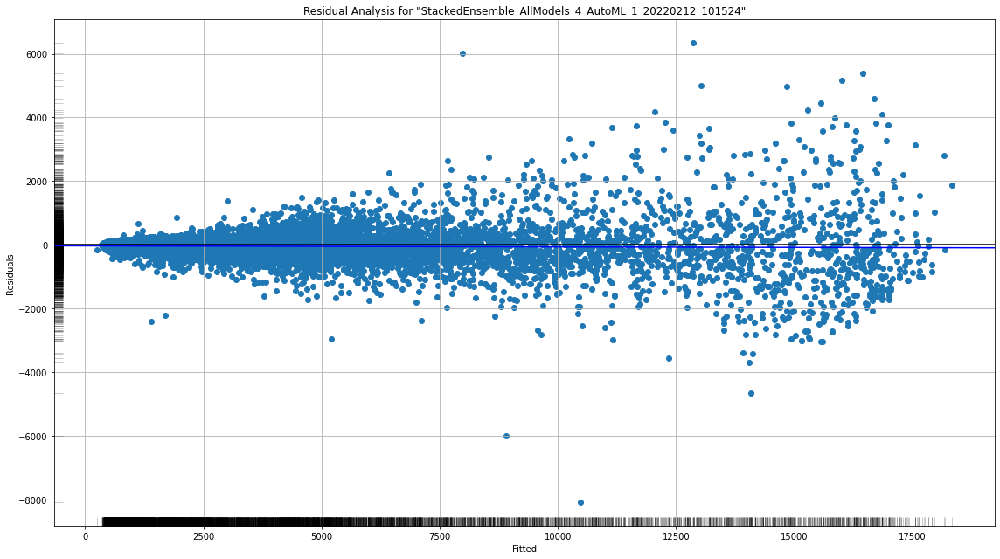

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

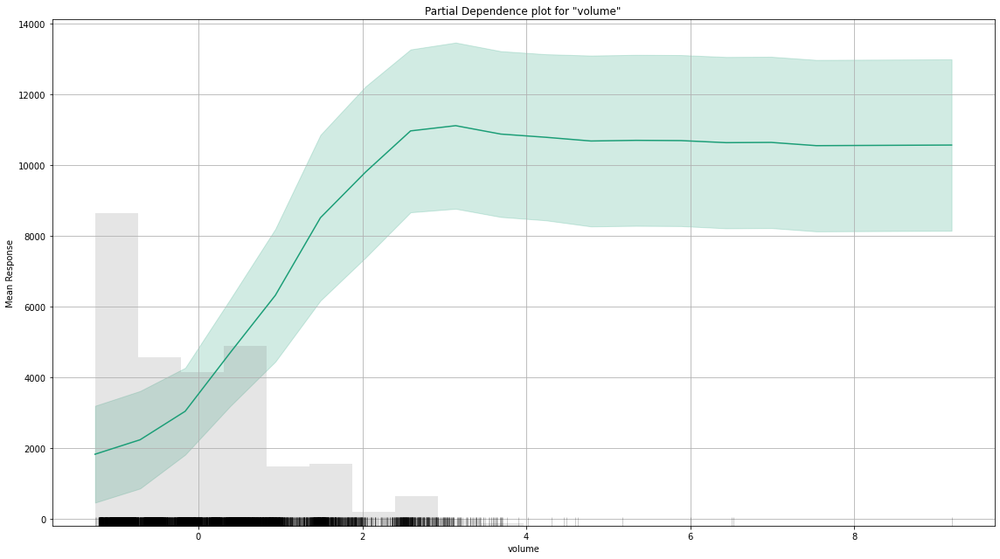

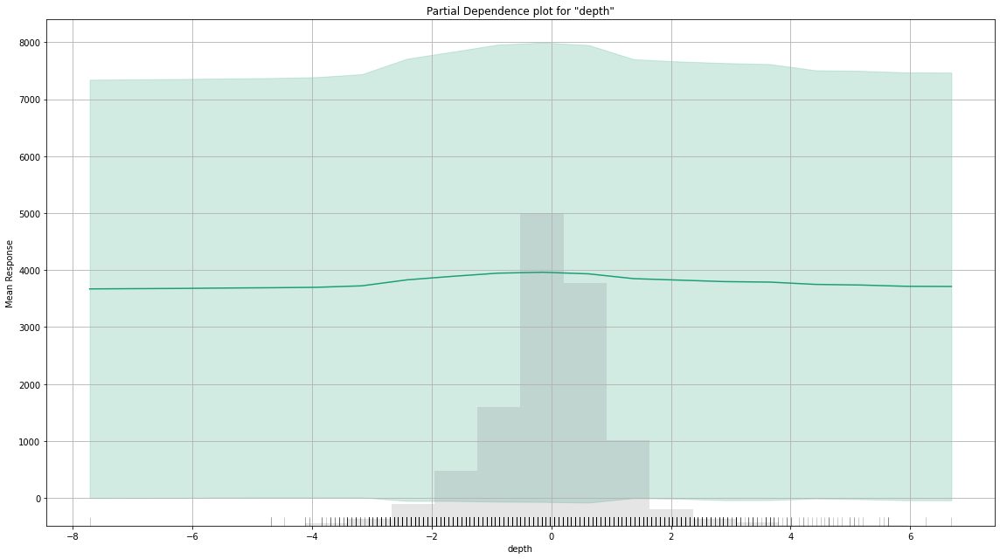

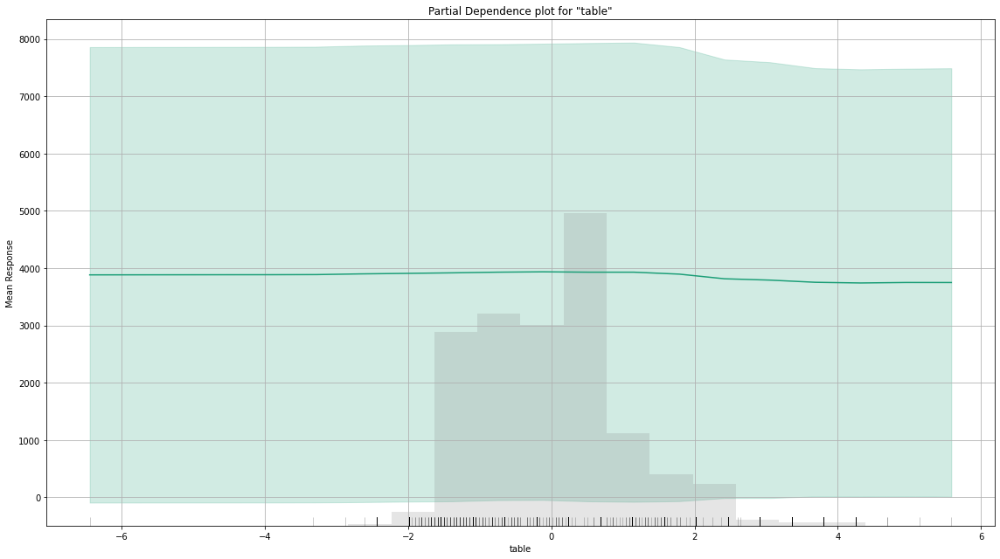

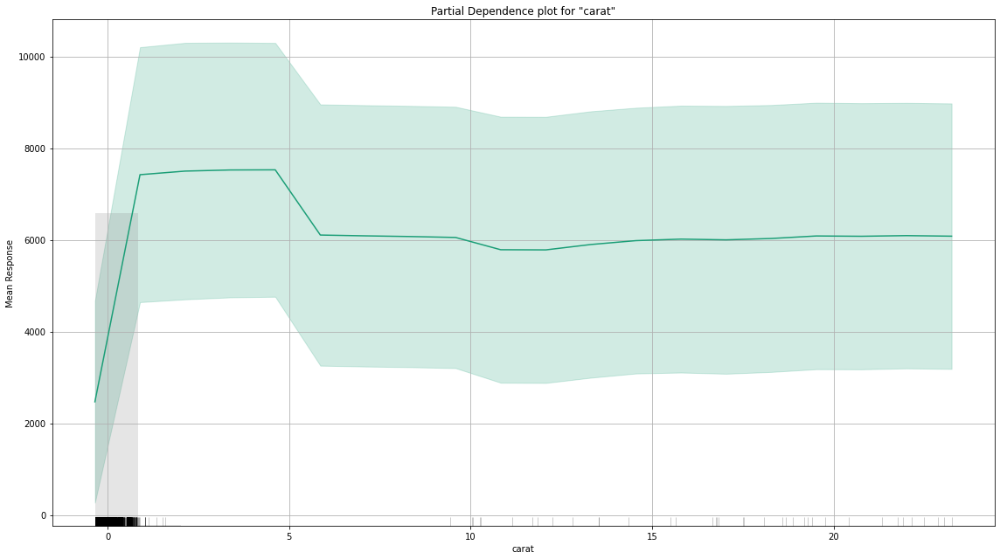

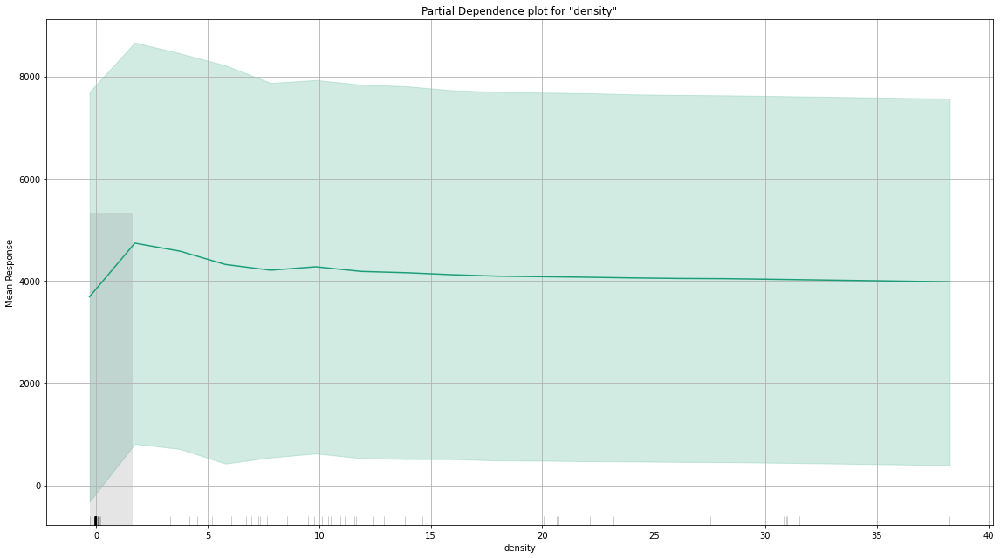

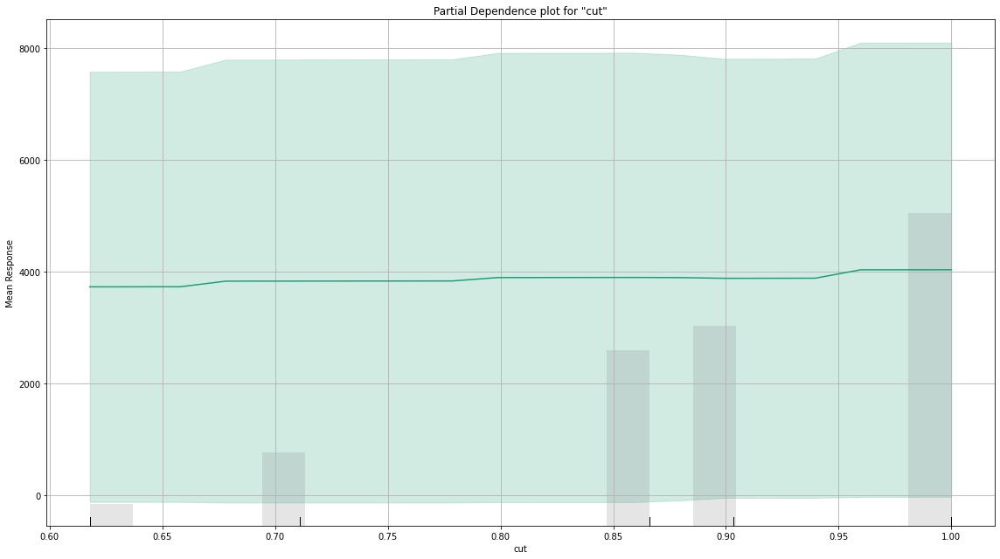

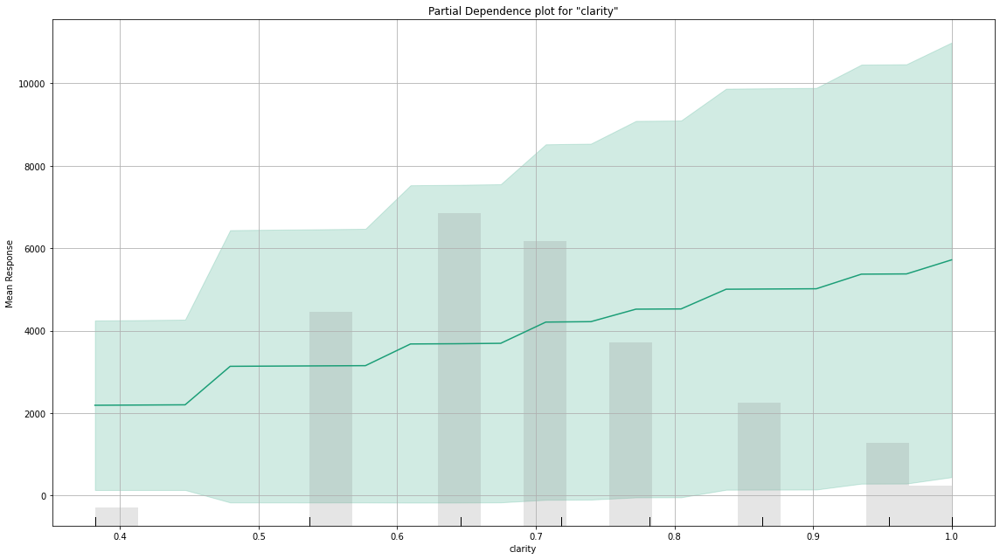

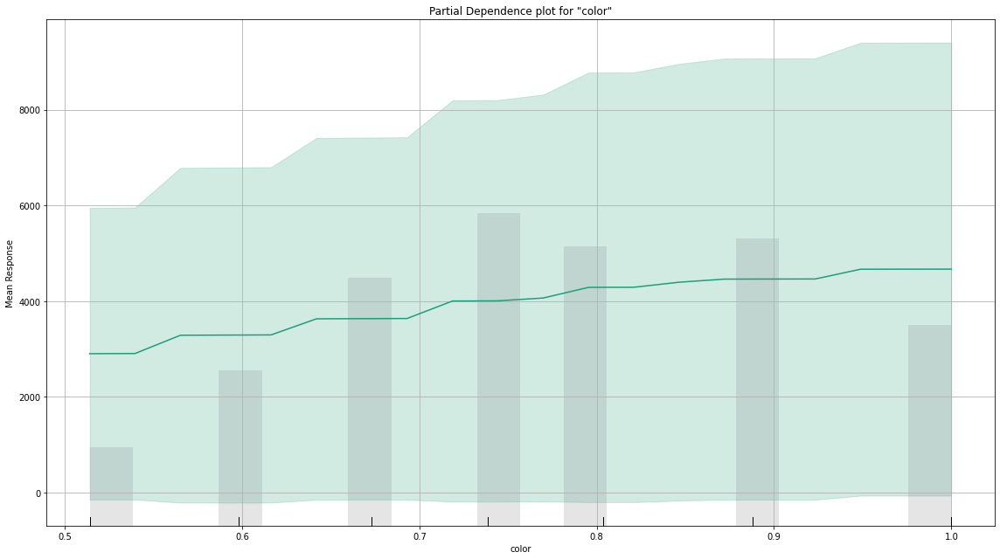

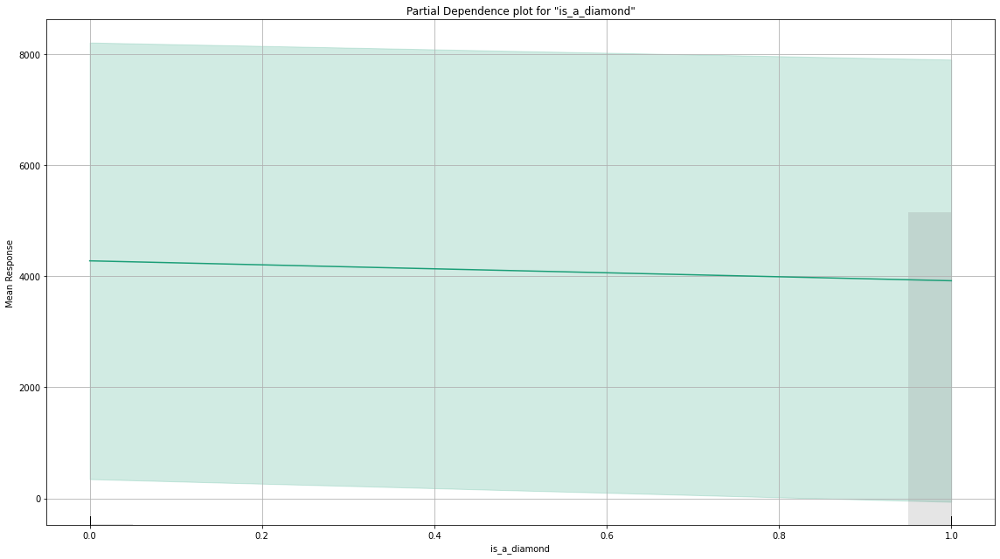

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

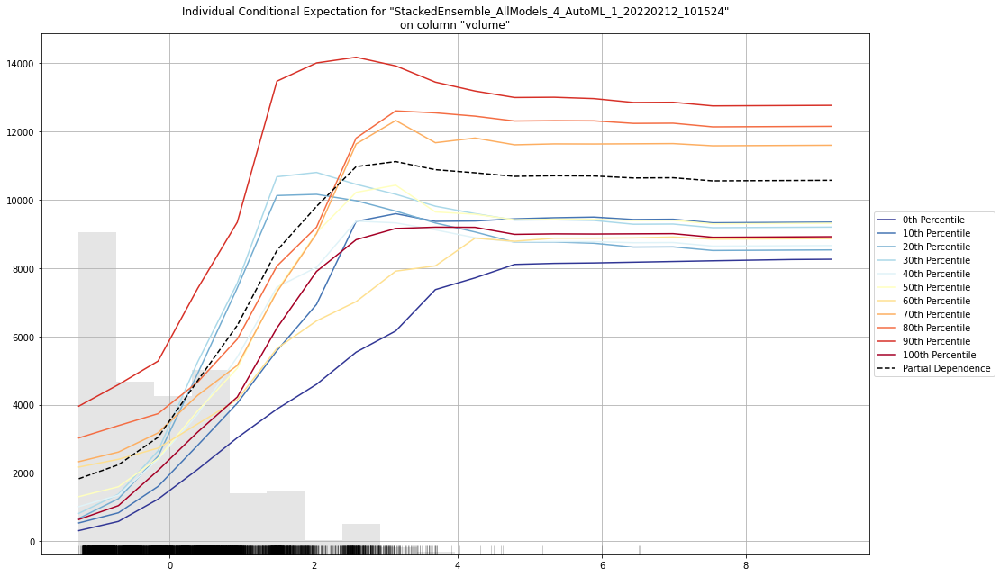

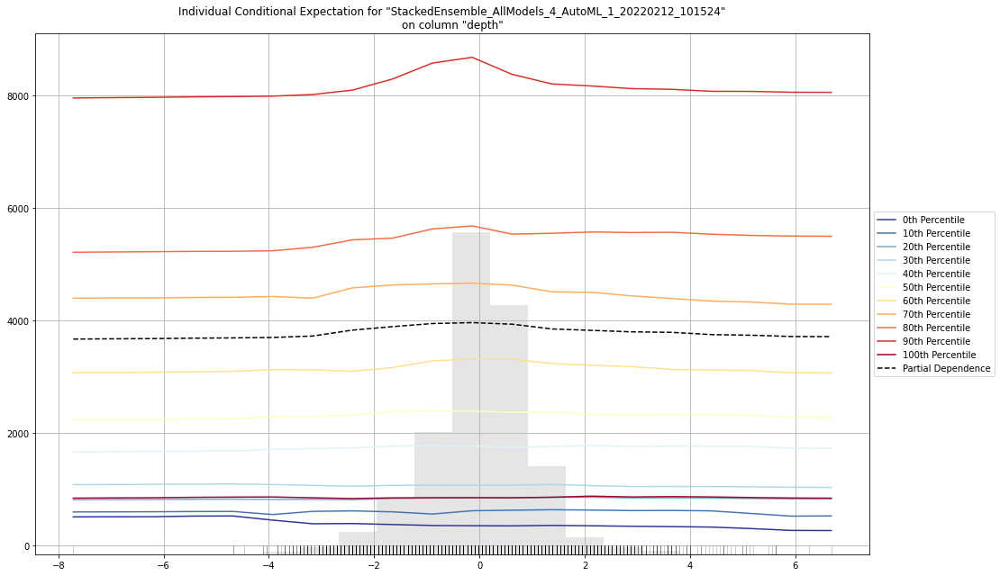

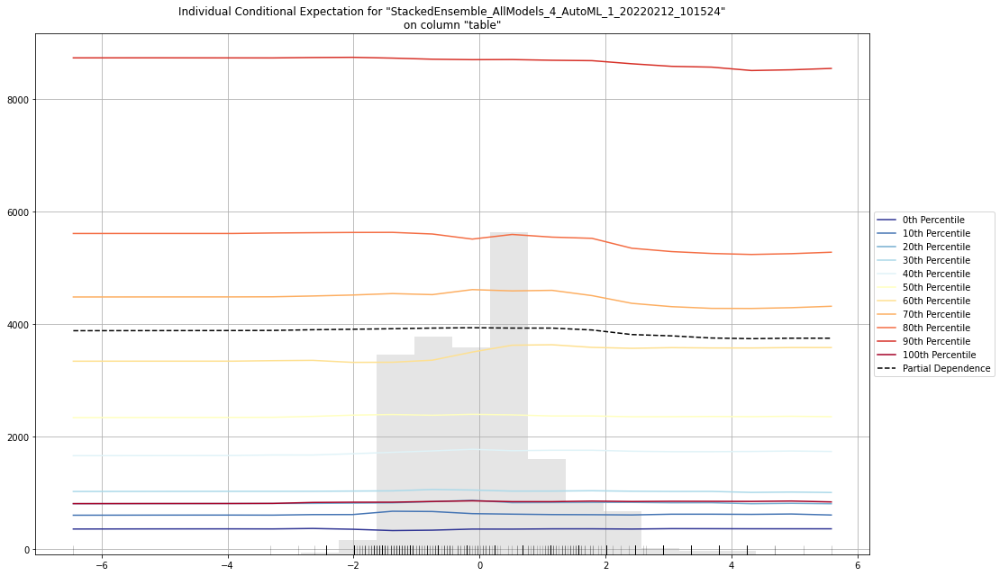

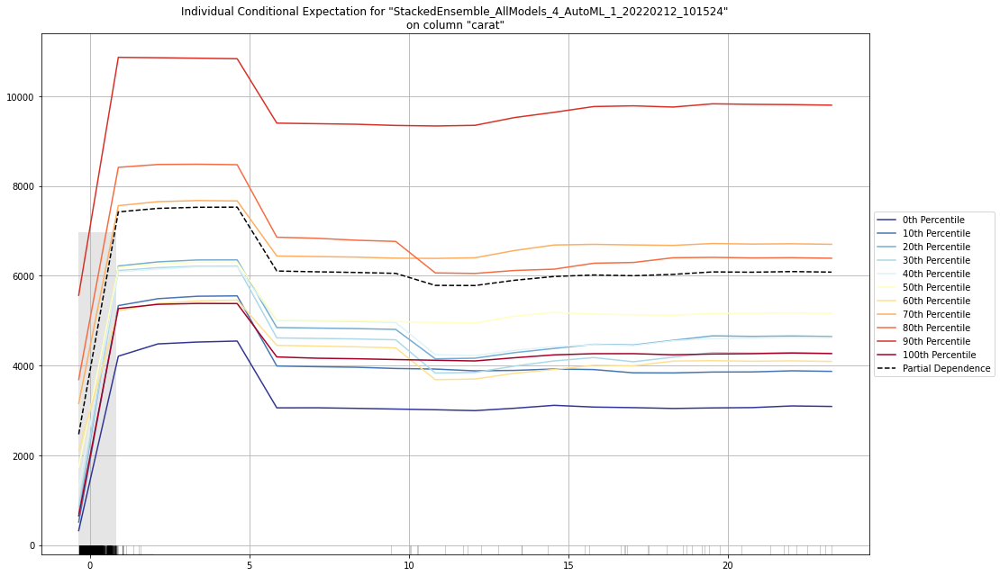

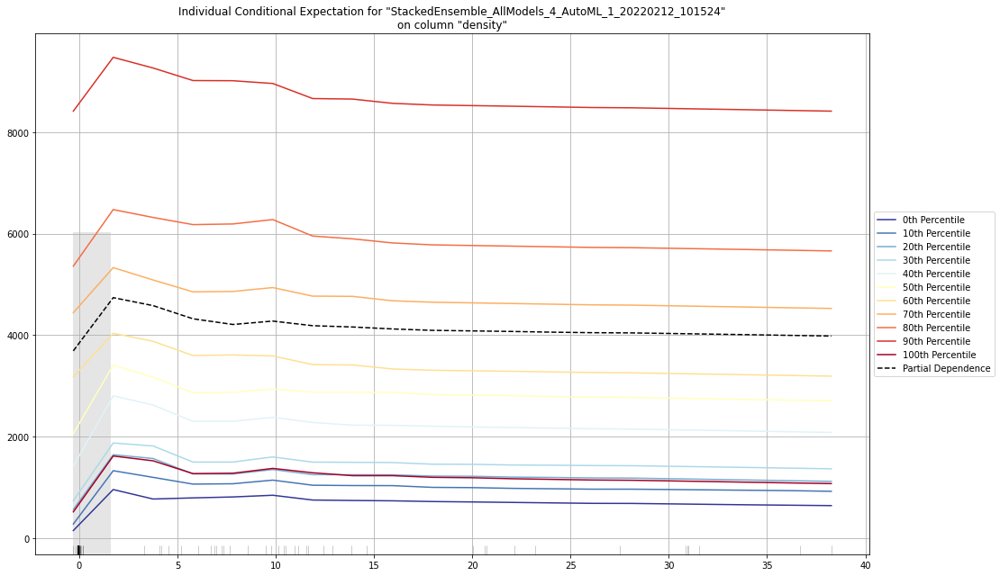

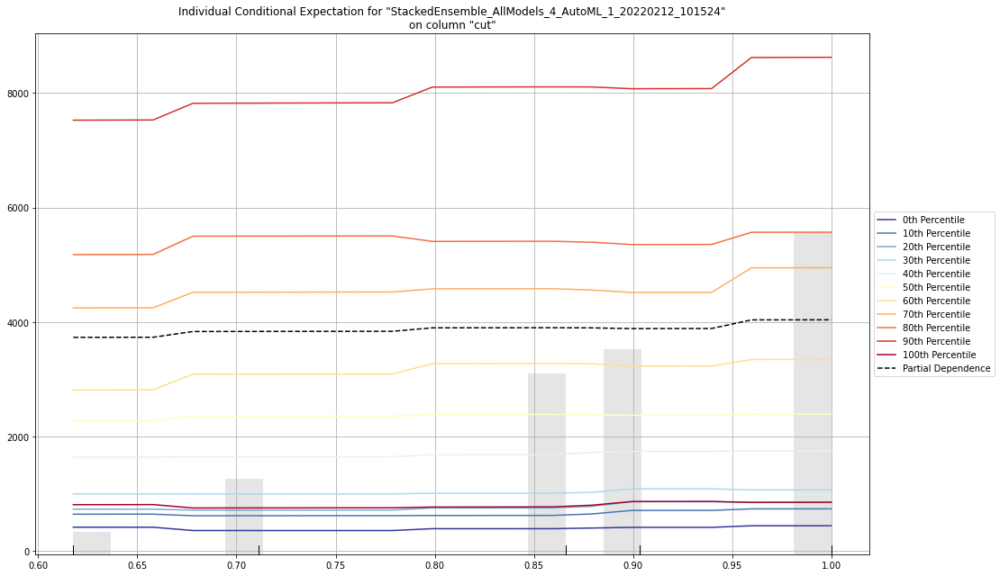

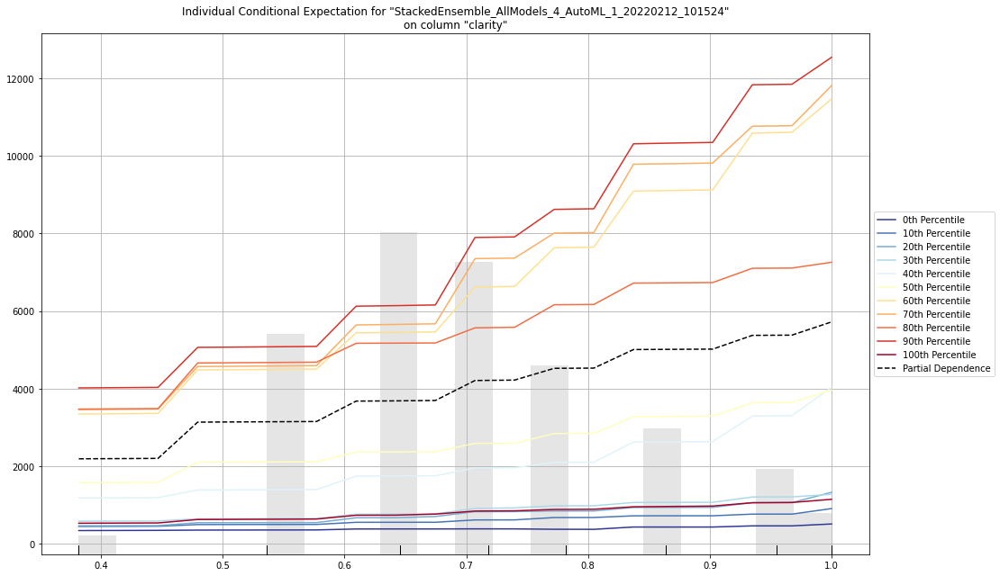

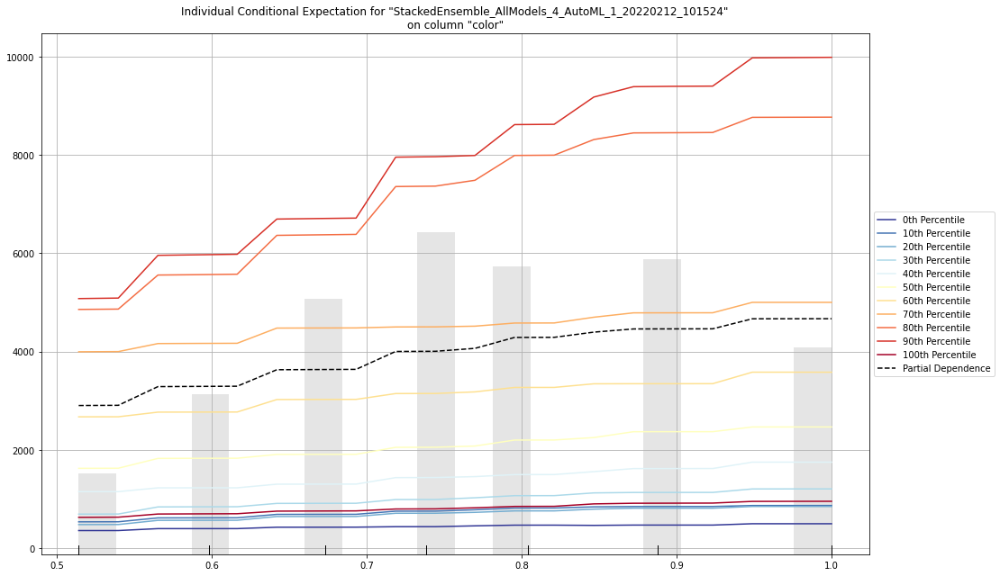

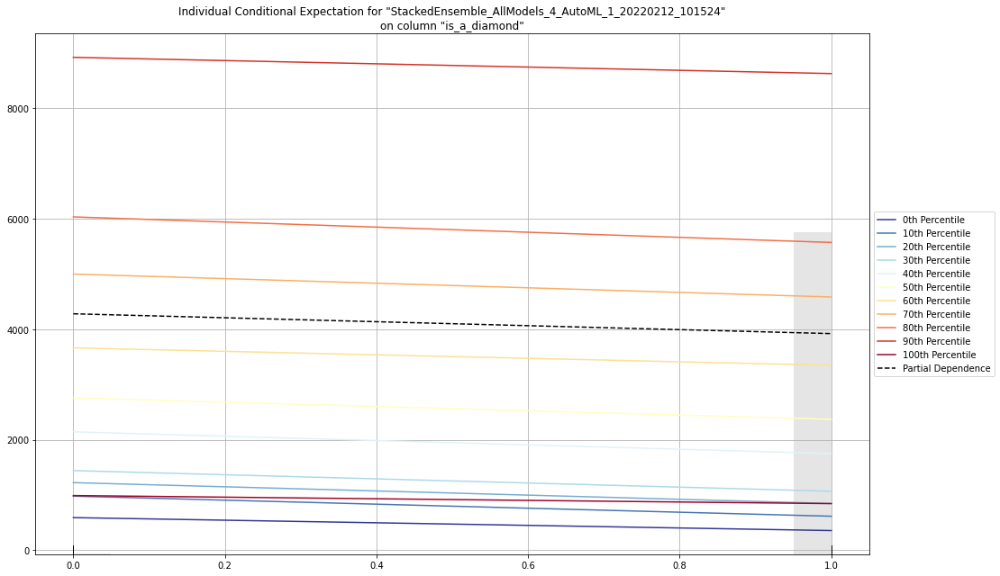

In [108]:
exm = aml.leader.explain(test)

## SC GRID TO DETERMINE OPTIMAL PARAMETERS

In [52]:
CBC=CatBoostRegressor(loss_function='RMSE')

parameters = {'depth'         : [7,8],
            'learning_rate' : [0.02],
            'iterations'    : [2000,2200,2400],
            'l2_leaf_reg'   : [2,3,4]
             }


Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=7)
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

0:	learn: 3915.1416233	total: 3.26ms	remaining: 6.52s
1:	learn: 3845.5619800	total: 6.43ms	remaining: 6.42s
2:	learn: 3777.9683450	total: 9.42ms	remaining: 6.27s
3:	learn: 3710.6868511	total: 12.2ms	remaining: 6.11s
4:	learn: 3645.6738415	total: 15ms	remaining: 5.98s
5:	learn: 3582.0830089	total: 17.8ms	remaining: 5.9s
6:	learn: 3519.5117245	total: 20.5ms	remaining: 5.84s
7:	learn: 3457.9862813	total: 23.3ms	remaining: 5.81s
8:	learn: 3396.8887608	total: 26.3ms	remaining: 5.83s
9:	learn: 3338.2597446	total: 29.3ms	remaining: 5.82s
10:	learn: 3279.5540705	total: 32.1ms	remaining: 5.81s
11:	learn: 3223.7051590	total: 35.1ms	remaining: 5.81s
12:	learn: 3167.9903862	total: 38.2ms	remaining: 5.84s
13:	learn: 3113.7856139	total: 41ms	remaining: 5.81s
14:	learn: 3059.8583844	total: 43.7ms	remaining: 5.78s
15:	learn: 3008.0022352	total: 46.4ms	remaining: 5.75s
16:	learn: 2956.0519246	total: 49.2ms	remaining: 5.74s
17:	learn: 2906.0807935	total: 52.1ms	remaining: 5.73s
18:	learn: 2856.2779521	t

192:	learn: 628.5270539	total: 548ms	remaining: 5.13s
193:	learn: 627.3699295	total: 551ms	remaining: 5.13s
194:	learn: 626.1132492	total: 554ms	remaining: 5.12s
195:	learn: 625.0202170	total: 556ms	remaining: 5.12s
196:	learn: 623.8196570	total: 559ms	remaining: 5.12s
197:	learn: 622.6850569	total: 562ms	remaining: 5.11s
198:	learn: 621.5549304	total: 565ms	remaining: 5.11s
199:	learn: 620.5004035	total: 567ms	remaining: 5.11s
200:	learn: 619.4612109	total: 570ms	remaining: 5.1s
201:	learn: 618.5610633	total: 573ms	remaining: 5.1s
202:	learn: 617.6989276	total: 575ms	remaining: 5.09s
203:	learn: 616.7049469	total: 578ms	remaining: 5.09s
204:	learn: 615.8209073	total: 581ms	remaining: 5.09s
205:	learn: 614.8499335	total: 583ms	remaining: 5.08s
206:	learn: 613.8313967	total: 586ms	remaining: 5.08s
207:	learn: 612.9940743	total: 589ms	remaining: 5.07s
208:	learn: 612.0895546	total: 592ms	remaining: 5.07s
209:	learn: 611.2367533	total: 595ms	remaining: 5.07s
210:	learn: 610.3610790	total:

391:	learn: 542.4363934	total: 1.09s	remaining: 4.48s
392:	learn: 542.2827139	total: 1.09s	remaining: 4.48s
393:	learn: 542.1529123	total: 1.1s	remaining: 4.47s
394:	learn: 541.8987665	total: 1.1s	remaining: 4.47s
395:	learn: 541.7874717	total: 1.1s	remaining: 4.47s
396:	learn: 541.6246699	total: 1.1s	remaining: 4.46s
397:	learn: 541.4573763	total: 1.11s	remaining: 4.46s
398:	learn: 541.3280469	total: 1.11s	remaining: 4.46s
399:	learn: 541.1691760	total: 1.11s	remaining: 4.46s
400:	learn: 541.0153410	total: 1.12s	remaining: 4.45s
401:	learn: 540.8916679	total: 1.12s	remaining: 4.45s
402:	learn: 540.7413700	total: 1.12s	remaining: 4.45s
403:	learn: 540.5978967	total: 1.13s	remaining: 4.45s
404:	learn: 540.3925041	total: 1.13s	remaining: 4.44s
405:	learn: 540.2801097	total: 1.13s	remaining: 4.44s
406:	learn: 540.0993992	total: 1.13s	remaining: 4.43s
407:	learn: 539.9656119	total: 1.14s	remaining: 4.43s
408:	learn: 539.8404566	total: 1.14s	remaining: 4.43s
409:	learn: 539.5879113	total: 1

589:	learn: 518.8647126	total: 1.64s	remaining: 3.91s
590:	learn: 518.8105837	total: 1.64s	remaining: 3.91s
591:	learn: 518.7282168	total: 1.64s	remaining: 3.91s
592:	learn: 518.6825680	total: 1.65s	remaining: 3.9s
593:	learn: 518.5886515	total: 1.65s	remaining: 3.9s
594:	learn: 518.5047758	total: 1.65s	remaining: 3.9s
595:	learn: 518.4075860	total: 1.65s	remaining: 3.9s
596:	learn: 518.3176302	total: 1.66s	remaining: 3.9s
597:	learn: 518.2676058	total: 1.66s	remaining: 3.89s
598:	learn: 518.1837043	total: 1.66s	remaining: 3.89s
599:	learn: 518.0936881	total: 1.67s	remaining: 3.89s
600:	learn: 518.0008461	total: 1.67s	remaining: 3.89s
601:	learn: 517.9787963	total: 1.67s	remaining: 3.88s
602:	learn: 517.8803968	total: 1.68s	remaining: 3.88s
603:	learn: 517.8033644	total: 1.68s	remaining: 3.88s
604:	learn: 517.7781746	total: 1.68s	remaining: 3.88s
605:	learn: 517.7232076	total: 1.68s	remaining: 3.87s
606:	learn: 517.6990123	total: 1.69s	remaining: 3.87s
607:	learn: 517.5683479	total: 1.

779:	learn: 504.7925933	total: 2.17s	remaining: 3.4s
780:	learn: 504.6744093	total: 2.18s	remaining: 3.4s
781:	learn: 504.5842397	total: 2.18s	remaining: 3.4s
782:	learn: 504.5027653	total: 2.18s	remaining: 3.4s
783:	learn: 504.3834885	total: 2.19s	remaining: 3.39s
784:	learn: 504.3059276	total: 2.19s	remaining: 3.39s
785:	learn: 504.2492084	total: 2.19s	remaining: 3.39s
786:	learn: 504.1698078	total: 2.2s	remaining: 3.38s
787:	learn: 504.0901597	total: 2.2s	remaining: 3.38s
788:	learn: 504.0690882	total: 2.2s	remaining: 3.38s
789:	learn: 503.9913717	total: 2.2s	remaining: 3.38s
790:	learn: 503.9356231	total: 2.21s	remaining: 3.37s
791:	learn: 503.8265007	total: 2.21s	remaining: 3.37s
792:	learn: 503.7527209	total: 2.21s	remaining: 3.37s
793:	learn: 503.6814868	total: 2.21s	remaining: 3.37s
794:	learn: 503.6010618	total: 2.22s	remaining: 3.36s
795:	learn: 503.5490910	total: 2.22s	remaining: 3.36s
796:	learn: 503.4634699	total: 2.22s	remaining: 3.36s
797:	learn: 503.3516117	total: 2.23s

971:	learn: 492.3725250	total: 2.72s	remaining: 2.88s
972:	learn: 492.3045885	total: 2.72s	remaining: 2.87s
973:	learn: 492.2530734	total: 2.72s	remaining: 2.87s
974:	learn: 492.2045708	total: 2.73s	remaining: 2.87s
975:	learn: 492.1824652	total: 2.73s	remaining: 2.86s
976:	learn: 492.1166599	total: 2.73s	remaining: 2.86s
977:	learn: 492.0299408	total: 2.74s	remaining: 2.86s
978:	learn: 491.9402585	total: 2.74s	remaining: 2.86s
979:	learn: 491.9342040	total: 2.74s	remaining: 2.85s
980:	learn: 491.8478018	total: 2.74s	remaining: 2.85s
981:	learn: 491.7873764	total: 2.75s	remaining: 2.85s
982:	learn: 491.7538417	total: 2.75s	remaining: 2.85s
983:	learn: 491.6994964	total: 2.75s	remaining: 2.84s
984:	learn: 491.6986503	total: 2.75s	remaining: 2.84s
985:	learn: 491.5945143	total: 2.76s	remaining: 2.84s
986:	learn: 491.5011286	total: 2.76s	remaining: 2.83s
987:	learn: 491.3906584	total: 2.76s	remaining: 2.83s
988:	learn: 491.3290299	total: 2.77s	remaining: 2.83s
989:	learn: 491.2717614	tota

1167:	learn: 481.6540402	total: 3.27s	remaining: 2.33s
1168:	learn: 481.6023940	total: 3.27s	remaining: 2.32s
1169:	learn: 481.5707466	total: 3.27s	remaining: 2.32s
1170:	learn: 481.5356027	total: 3.27s	remaining: 2.32s
1171:	learn: 481.4665631	total: 3.28s	remaining: 2.31s
1172:	learn: 481.4217130	total: 3.28s	remaining: 2.31s
1173:	learn: 481.3739653	total: 3.28s	remaining: 2.31s
1174:	learn: 481.2613516	total: 3.29s	remaining: 2.31s
1175:	learn: 481.2142794	total: 3.29s	remaining: 2.3s
1176:	learn: 481.1889463	total: 3.29s	remaining: 2.3s
1177:	learn: 481.1420679	total: 3.29s	remaining: 2.3s
1178:	learn: 481.0926538	total: 3.3s	remaining: 2.3s
1179:	learn: 481.0365372	total: 3.3s	remaining: 2.29s
1180:	learn: 481.0340174	total: 3.3s	remaining: 2.29s
1181:	learn: 480.9974739	total: 3.3s	remaining: 2.29s
1182:	learn: 480.9259204	total: 3.31s	remaining: 2.28s
1183:	learn: 480.8909393	total: 3.31s	remaining: 2.28s
1184:	learn: 480.8402659	total: 3.31s	remaining: 2.28s
1185:	learn: 480.7

1362:	learn: 472.6567830	total: 3.81s	remaining: 1.78s
1363:	learn: 472.5661670	total: 3.81s	remaining: 1.78s
1364:	learn: 472.5542039	total: 3.82s	remaining: 1.77s
1365:	learn: 472.4683424	total: 3.82s	remaining: 1.77s
1366:	learn: 472.4456022	total: 3.82s	remaining: 1.77s
1367:	learn: 472.3991835	total: 3.82s	remaining: 1.77s
1368:	learn: 472.3338133	total: 3.83s	remaining: 1.76s
1369:	learn: 472.2945029	total: 3.83s	remaining: 1.76s
1370:	learn: 472.2296859	total: 3.83s	remaining: 1.76s
1371:	learn: 472.1413430	total: 3.83s	remaining: 1.75s
1372:	learn: 472.1090556	total: 3.84s	remaining: 1.75s
1373:	learn: 472.0658743	total: 3.84s	remaining: 1.75s
1374:	learn: 472.0183771	total: 3.84s	remaining: 1.75s
1375:	learn: 471.9868483	total: 3.85s	remaining: 1.74s
1376:	learn: 471.9492829	total: 3.85s	remaining: 1.74s
1377:	learn: 471.9242938	total: 3.85s	remaining: 1.74s
1378:	learn: 471.9016231	total: 3.86s	remaining: 1.74s
1379:	learn: 471.8902469	total: 3.86s	remaining: 1.73s
1380:	lear

1558:	learn: 464.5775570	total: 4.35s	remaining: 1.23s
1559:	learn: 464.5687102	total: 4.36s	remaining: 1.23s
1560:	learn: 464.5030561	total: 4.36s	remaining: 1.23s
1561:	learn: 464.4810076	total: 4.36s	remaining: 1.22s
1562:	learn: 464.4274597	total: 4.36s	remaining: 1.22s
1563:	learn: 464.4029802	total: 4.37s	remaining: 1.22s
1564:	learn: 464.3425341	total: 4.37s	remaining: 1.21s
1565:	learn: 464.2701163	total: 4.37s	remaining: 1.21s
1566:	learn: 464.2311898	total: 4.38s	remaining: 1.21s
1567:	learn: 464.1849919	total: 4.38s	remaining: 1.21s
1568:	learn: 464.1512596	total: 4.38s	remaining: 1.2s
1569:	learn: 464.1378367	total: 4.38s	remaining: 1.2s
1570:	learn: 464.1373378	total: 4.38s	remaining: 1.2s
1571:	learn: 464.1031027	total: 4.39s	remaining: 1.19s
1572:	learn: 464.0698986	total: 4.39s	remaining: 1.19s
1573:	learn: 464.0295553	total: 4.39s	remaining: 1.19s
1574:	learn: 464.0087930	total: 4.4s	remaining: 1.19s
1575:	learn: 463.9737446	total: 4.4s	remaining: 1.18s
1576:	learn: 46

1759:	learn: 457.7545611	total: 4.9s	remaining: 668ms
1760:	learn: 457.7327508	total: 4.9s	remaining: 665ms
1761:	learn: 457.6639375	total: 4.9s	remaining: 662ms
1762:	learn: 457.6510126	total: 4.91s	remaining: 660ms
1763:	learn: 457.6208160	total: 4.91s	remaining: 657ms
1764:	learn: 457.6143758	total: 4.91s	remaining: 654ms
1765:	learn: 457.5491600	total: 4.91s	remaining: 651ms
1766:	learn: 457.5207199	total: 4.92s	remaining: 648ms
1767:	learn: 457.4842181	total: 4.92s	remaining: 646ms
1768:	learn: 457.4213743	total: 4.92s	remaining: 643ms
1769:	learn: 457.4001954	total: 4.92s	remaining: 640ms
1770:	learn: 457.3777457	total: 4.93s	remaining: 637ms
1771:	learn: 457.3222508	total: 4.93s	remaining: 635ms
1772:	learn: 457.3049276	total: 4.93s	remaining: 632ms
1773:	learn: 457.2907921	total: 4.94s	remaining: 629ms
1774:	learn: 457.2355360	total: 4.94s	remaining: 626ms
1775:	learn: 457.2124882	total: 4.94s	remaining: 623ms
1776:	learn: 457.1954423	total: 4.95s	remaining: 621ms
1777:	learn: 

1955:	learn: 452.2016456	total: 5.44s	remaining: 122ms
1956:	learn: 452.1771773	total: 5.44s	remaining: 120ms
1957:	learn: 452.1049690	total: 5.45s	remaining: 117ms
1958:	learn: 452.1045699	total: 5.45s	remaining: 114ms
1959:	learn: 452.0477052	total: 5.45s	remaining: 111ms
1960:	learn: 452.0153680	total: 5.45s	remaining: 108ms
1961:	learn: 451.9777199	total: 5.46s	remaining: 106ms
1962:	learn: 451.9695589	total: 5.46s	remaining: 103ms
1963:	learn: 451.9562367	total: 5.46s	remaining: 100ms
1964:	learn: 451.9127153	total: 5.46s	remaining: 97.3ms
1965:	learn: 451.8314758	total: 5.47s	remaining: 94.6ms
1966:	learn: 451.8269137	total: 5.47s	remaining: 91.8ms
1967:	learn: 451.7799996	total: 5.47s	remaining: 89ms
1968:	learn: 451.7451543	total: 5.48s	remaining: 86.2ms
1969:	learn: 451.7401956	total: 5.48s	remaining: 83.4ms
1970:	learn: 451.7049679	total: 5.48s	remaining: 80.7ms
1971:	learn: 451.6875596	total: 5.48s	remaining: 77.9ms
1972:	learn: 451.6064732	total: 5.49s	remaining: 75.1ms
197

## XG Boost

In [734]:
df_train_2.head()

,carat,cut,color,clarity,depth,table,price,id,volume,density,is_a_diamond,price_carat
0,1.01,0.865967,0.803738,0.536364,62.2,58.0,4332.0,0,55.389698,3.646888,1,4289.108911
1,0.90,0.865967,0.598131,0.718182,61.4,58.0,4089.0,1,51.698351,3.481736,1,4543.333333
2,0.53,1.000000,0.887850,0.863636,62.2,54.0,2273.0,2,30.536663,3.471237,1,4288.679245
3,0.32,1.000000,0.598131,1.000000,60.8,54.0,673.0,3,18.675288,3.426989,1,2103.125000
4,1.06,1.000000,0.738318,0.863636,61.0,57.0,7900.0,4,59.768750,3.547004,1,7452.830189


In [735]:
#df_train_2 = df_train_2.drop(df_train_2[(df_train_2['price_carat'] < 800) & (df_train_2['volume'] > 175)].index)
# Formula was just to try to exclude outliers but worsened the results

In [74]:
#separate X and Y

X = df_train_2[[
                'volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                ,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                ,'is_a_diamond'
               ]]      # extra features

y = df_train_2['price']

X_train, X_test, y_train, y_test = tts(X,y,test_size=0.2, train_size=0.8, random_state=42)

X_graded = df_test_2[[
                'volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                ,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                ,'is_a_diamond'
               ]]



In [75]:
X.shape, y.shape

((35927, 9), (35927,))

In [76]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((28741, 9), (7186, 9), (28741,), (7186,))

In [77]:
sc = StandardScaler()


X_train[['volume'
         ,'depth' 
         ,'table'
         ,'carat'
         ,'density'
        ]] = sc.fit_transform(X_train[['volume',
                                       'depth', 
                                       'table',
                                       'carat',
                                       'density'
                                      ]])
X_test[['volume',
        'depth', 
        'table',
        'carat',
        'density'
       ]] = sc.transform(X_test[['volume',
                                 'depth', 
                                 'table',
                                 'carat',
                                 'density'
                                ]])

#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

In [85]:
rf = xgb.XGBRegressor(n_estimators=2200,subsample=0.3,max_depth=9,learning_rate=0.004,gamma=1.45)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

print('')
print('Score : %.4f' % rf.score(X_test, y_test))


rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')

print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)


train_score=rf.score(X_train, y_train)  
test_score=rf.score(X_test, y_test)


#train_score, test_score, cross_val_score(rf, X_test, y_test, cv=5)





Score : 0.9823

RMSE   : 527.87 
R2     : 0.98 


## CATBOOST (WINNER)

In [86]:
#separate X and Y

X = df_train_2[['volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                ,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                ,'is_a_diamond'
    #,"x","y","z"
               ]]
y = df_train_2['price']

X_graded = df_test_2[['volume' 
                ,'depth'
                ,'table'   
                ,'carat'
                ,'density'
                ,'cut'
                ,'clarity'
                ,'color' 
                ,'is_a_diamond'
    #,"x","y","z"
                     ]]


,price,id
0,1922.0,0
1,1046.0,1
2,3115.0,2
3,5624.0,3
4,4536.0,4
5,568.0,5
6,1779.0,6
7,2218.0,7
8,9930.0,8
9,4284.0,9


In [87]:
X.shape, y.shape, X_graded.shape

((35927, 12), (35927,), (12000, 12))

In [88]:
sc = StandardScaler()

#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

X[['volume','depth', 'table','carat','density']] = sc.fit_transform(X[['volume','depth', 'table','carat','density']])
X_graded[['volume','depth', 'table','carat','density']] = sc.transform(X_graded[['volume','depth', 'table','carat','density']])

In [89]:
X.shape, y.shape, X_graded.shape

((35927, 12), (35927,), (12000, 12))

In [90]:
X_graded.is_a_diamond.value_counts()

1    11960
0       40
Name: is_a_diamond, dtype: int64

In [91]:
rf = CatBoostRegressor(depth=8, learning_rate=0.02, l2_leaf_reg=4, iterations=3200, loss_function='RMSE', logging_level='Silent')
cat_variables=['is_a_diamond']
rf.fit(X , y, cat_variables)
y_pred = rf.predict(X_graded)

train_score=rf.score(X, y)  # R2 score


train_score

0.9909558587394275

In [92]:
y_graded=pd.DataFrame(y_pred)

In [93]:
y_graded=y_graded.rename(columns = {'0': 'price'})

In [94]:
y_graded.columns = ['price']

In [95]:
y_graded

,price
0,1914.073043
1,897.923349
2,3290.925715
3,4842.956409
4,4514.085313
5,611.672730
6,1897.908754
7,2511.669411
8,9433.145801
9,4011.707015


In [96]:
y_graded["id"]=y_graded.index

In [97]:
y_graded

,price,id
0,1914.073043,0
1,897.923349,1
2,3290.925715,2
3,4842.956409,3
4,4514.085313,4
5,611.672730,5
6,1897.908754,6
7,2511.669411,7
8,9433.145801,8
9,4011.707015,9


In [98]:
##LOGARITMO REVERSE

##y_graded["price"] = y_graded["price"].apply(np.exp)

In [99]:
y_graded.to_csv("Manu Cabanillas_finaldiamondxyzx2.csv",index=False)